In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cooler
import pandas as pd
import os
import sys
from tqdm import tqdm


module_path = os.path.abspath(os.path.join(os.pardir, os.pardir))
if module_path not in sys.path:
    sys.path.append(module_path)

from HICT_Patterns.hict.patterns.help_functions import get_genome_coords_single, calculate_diag_means, get_chromosome_coords
from HICT_Patterns.hict.patterns.models import *

local_path = 'D:/Study/HICT/HICT_Patterns/'

In [2]:
data = pd.read_excel("D:\Downloads\media-2.xlsx", sheet_name='INV.S2',  skiprows=[0])
data

,Species,Assembly,T2T Chm13\n RefChrom_tmp,T2T Chm13 RefChrom,T2T Chm13\n RefStart,T2T Chm13\n RefEnd,Size,QueChrom_tmp,QueChrom,QueStart,...,T2T Chm13 Reference RepeatContents_breakpoint_5p\n (Repeat/Type/Str__Proportion),T2T Chm13 Reference RepeatContents breakpoint_3p\n (Repeat/Type/Str__Proportion),Query RepeatContents breakpoint_5p\n (Repeat/Type/Str__Proportion),Query RepeatContents breakpoint_3p\n (Repeat/Type/Str__Proportion),Genes breakpoint_5p,Genes breakpoint_3p,Duplicons breakpoint_5p (repeatmasker),Duplicons breakpoint_3p (repeatmasker),known/new inversions,Notes
0,AG05252_PPY,AG05252_PPY.hap1,chr3_hap1,chr3,502806,15125015,14622210,chr3_hap1,chr2_hap1_hsa3,62725428,...,"L1PA8|LINE/L1|C__0.21,MLT1K|LTR/ERVL-MaLR|+__0...","LTR5A|LTR/ERVK|C__0.00,L2b|LINE/L2|+__0.30,MIR...","L2a|LINE/L2|C__0.29,L3|LINE/CR1|+__0.18","MIR3|SINE/MIR|C__0.07,L1P4|LINE/L1|+__0.58",NaN,NaN,NaN,NaN,Locke2011\n Catacchio2018,NaN
1,Jim_GGO,Jim_GGO.hap1,chr10_hap1,chr10,27377900,80234292,52856393,chr10_hap1,chr8_mat_hsa10,36510376,...,(TTTC)n|Simple_repeat|+__0.22,L1MB8|LINE/L1|+__1.00,"MIRc|SINE/MIR|C__0.23,Tigger14a|DNA/TcMar-Tigg...","MIRb|SINE/MIR|C__0.22,(A)n|Simple_repeat|+__0.03",NaN,NaN,"SD4781|+,SD4780|-,SD4779|-",NaN,Catacchio2018\n Porubsky2020\n Yunis&Prakash19...,NaN
2,PR00251_PPA,PR00251_PPA.hap1,chr7_hap1,chr7,59820810,64669867,4849058,chr7_hap1,chr6_mat_hsa7,76801740,...,ALR/Alpha|Satellite/centr|C__1.00,"AluSx|SINE/Alu|C__0.30,L1PA5|LINE/L1|+__0.06","HAL1b|LINE/L1|+__0.38,HAL1b|LINE/L1|+__0.09,L1...",(TGGAA)n|Simple_repeat|+__1.00,NaN,NaN,NaN,SD4574|+,new,NaN
3,AG05252_PPY,AG05252_PPY.hap1,chr9_hap1,chr9,189418,79226372,79036955,chr9_hap1,chr13_hap1_hsa9,16951365,...,"(TA)n|Simple_repeat|+__0.03,HAL1|LINE/L1|C__0....","THE1C|LTR/ERVL-MaLR|+__0.34,MSTB|LTR/ERVL-MaLR...","L1ME3A|LINE/L1|C__0.20,L1MC5|LINE/L1|C__0.12,A...","AluSz|SINE/Alu|+__0.31,(TA)n|Simple_repeat|+__...",NaN,NaN,SD8379|+,SD8374|-,Catacchio2018\n Porubsky2020\n Kehrer-Sawatzki...,NaN
4,AG05252_PPY,AG05252_PPY.hap1,chr7_hap1,chr7,7612313,77723879,70111567,chr7_hap1,chr6_hap1_hsa7,11837614,...,"AluSx|SINE/Alu|+__0.31,(AT)n|Simple_repeat|+__...","AluSx|SINE/Alu|C__0.12,AluSx|SINE/Alu|+__0.29","MIR1_Amn|SINE/MIR|+__0.12,AluSq|SINE/Alu|+__0.21","L1ME2|LINE/L1|+__0.15,MER129|LTR|C__0.20,UCON3...",COL28A1,ZP3,NaN,SD6715|-,Locke2011\n Müller2004,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1170,Jambi_SSY,Jambi_SSY.hap1,chr21_hap1,chr21,26389840,26399956,10117,chr5_hap1,chr5_hap1,102126817,...,"L2|LINE/L2|+__0.56,L2|LINE/L2|+__0.37",HERVL-int|LTR/ERVL|C__1.00,"L1Hylob|LINE/L1|C__0.08,AluSx|SINE/Alu|+__0.30...",NaN,NaN,NaN,"SD6219|+,SD6218|+",NaN,new,NaN
1171,Jim_GGO,Jim_GGO.hap1,chr1_hap1,chr1,241659352,242106987,447636,chr1_hap1,chr1_mat_hsa1,7966160,...,"AluJb|SINE/Alu|+__0.12,MIR|SINE/MIR|C__0.08,L1...",(TA)n|Simple_repeat|+__0.41,GAP_chr1_80bp|Satellite|C__1.00,GAP_chr1_80bp|Satellite|C__1.00,PLD5,NaN,NaN,NaN,Porubsky2020,NaN
1172,Jim_GGO,Jim_GGO.hap1,chr1_hap1,chr1,242229514,242486193,256680,chr1_hap1,chr1_mat_hsa1,7506864,...,"MER61D|LTR/ERV1|C__0.50,MIRb|SINE/MIR|+__0.09,...","MLT1D|LTR/ERVL-MaLR|C__0.29,AluJr|SINE/Alu|+__...",GAP_chr1_80bp|Satellite|C__1.00,"MLT1B|LTR/ERVL-MaLR|+__0.35,L1ME2|LINE/L1|C__0.48",NaN,NaN,SD2972|+,SD7027|+,Porubsky2020,NaN
1173,AG06213_PAB,AG06213_PAB.hap1,chr21_hap1,chr21,26389864,26399963,10100,chr21_hap1,chr22_hap1_hsa21,38208236,...,"L2|LINE/L2|+__0.54,L2|LINE/L2|+__0.37",HERVL-int|LTR/ERVL|C__1.00,"AluSx|SINE/Alu|+__0.27,A-rich|Low_complexity|+...","AluSc8|SINE/Alu|C__0.14,AluSx4|SINE/Alu|C__0.09",NaN,NaN,"SD6219|+,SD6218|+",NaN,new,NaN


In [3]:
species = set(data.Species)
for specie in species:
    print(specie, data[data.Species == specie].shape[0])

AG05252_PPY 180
Jambi_SSY 257
AG18354_PTR 171
Jim_GGO 199
PR00251_PPA 188
AG06213_PAB 180


In [27]:
def calc_metrics(results_df, gor_df, inaccuracy_list):
    precision_list = []
    recall_list = []
    f1_list = []

    tp_list = []
    fn_list = []
    tn_list = []
    fp_list = []
    results_df = results_df.reset_index(drop=True)
    gor_df = gor_df.reset_index(drop=True)

    for inaccuracy in inaccuracy_list:
        tp = 0
        fn = len(gor_df)
        found_list = [False]*len(gor_df)

        for index, row in results_df.iterrows():
            for index_a, row_a in gor_df.iterrows():
                if (abs(row_a.astart_res-row.bp_res) <= inaccuracy) and (row_a.achr == row.chrom) and (found_list[index_a] == False) and (row.species==row_a.species):
                    tp+=1
                    fn-=1
                    found_list[index_a] = True
                if (abs(row_a.bstart_res-row.bp_res) <= inaccuracy) and (row_a.bchr == row.chrom) and (found_list[index_a]== False) and (row.species==row_a.species):
                    tp+=1
                    fn-=1
                    found_list[index_a] = True
                if (abs(row_a.aend_res-row.bp_res) <= inaccuracy) and (row_a.achr == row.chrom) and (found_list[index_a] == False) and (row.species==row_a.species):
                    tp+=1
                    fn-=1
                    found_list[index_a] = True
                if (abs(row_a.bend_res-row.bp_res) <= inaccuracy) and (row_a.bchr == row.chrom) and (found_list[index_a]== False) and (row.species==row_a.species):
                    tp+=1
                    fn-=1
                    found_list[index_a] = True
        
        precision = tp/(len(results_df))
        recall = tp/(tp+fn)

        precision_list.append(precision)
        recall_list.append(recall)
        if precision+recall == 0:
            f1_list.append(0)
        else:
            f1_list.append(2*(precision*recall)/(precision+recall))

        tp_list.append(tp)
        fn_list.append(fn)
        tn_list.append(0)
        fp_list.append(len(results_df)-tp)
    
    return precision_list, recall_list, f1_list, tp_list, fn_list, tn_list, fp_list

In [4]:
from sklearn import metrics
def print_conf_matrices(tp_list, fn_list, tn_list, fp_list, inaccuracy_list, title):
    for tp, fn, tn, fp, inaccuracy in zip(tp_list, fn_list, tn_list, fp_list, inaccuracy_list):
        confusion_matrix = np.array([[tn, fp], 
                            [fn, tp]])
        cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [0, 1])
        print(f'{title}, {inaccuracy} kbp')
        cm_display.plot()
        plt.show()

In [24]:
united_hict = {
    'species':[],
    'chrom':[],
    'bp':[],
}

result = pd.read_csv(f'{local_path}result_Gor_CHM13.csv')
result.drop_duplicates(keep=False,inplace=True)
species = 'Gor_CHM13'
c = cooler.Cooler(f'D:\Study\Hi-C_data\{species}_4DN.mcool::/resolutions/1000')
chroms_1_bps_1 = get_chromosome_coords(result.bp_1, c.chromsizes, 1)
chroms_2_bps_2 = get_chromosome_coords(result.bp_2, c.chromsizes, 1)
for chrom_1_bp_1, chrom_2_bp_2 in zip(chroms_1_bps_1, chroms_2_bps_2):
    united_hict['species'].append(species)
    united_hict['chrom'].append(c.chromnames[chrom_2_bp_2[0]])
    united_hict['bp'].append(chrom_2_bp_2[1])

    united_hict['species'].append(species)
    united_hict['chrom'].append(c.chromnames[chrom_1_bp_1[0]])
    united_hict['bp'].append(chrom_1_bp_1[1])

united_hict_df = pd.DataFrame(united_hict)
united_hict_df['used_tool'] = 'HiCT_Patterns'
united_hict_df['bp_res'] = united_hict_df['bp']//1000
united_hict_df.drop_duplicates(subset=['bp_res'],keep=False,inplace=True, ignore_index=True)
united_hict_df

,species,chrom,bp,used_tool,bp_res
0,Gor_CHM13,chr1,2430000,HiCT_Patterns,2430
1,Gor_CHM13,chr1,2091000,HiCT_Patterns,2091
2,Gor_CHM13,chr1,104363000,HiCT_Patterns,104363
3,Gor_CHM13,chr1,113280000,HiCT_Patterns,113280
4,Gor_CHM13,chr1,109376000,HiCT_Patterns,109376
5,Gor_CHM13,chr1,113114000,HiCT_Patterns,113114
6,Gor_CHM13,chr1,157032000,HiCT_Patterns,157032
7,Gor_CHM13,chr1,157031000,HiCT_Patterns,157031
8,Gor_CHM13,chr1,210730000,HiCT_Patterns,210730
9,Gor_CHM13,chr1,210729000,HiCT_Patterns,210729


In [14]:
united_hict = {
    'species':[],
    'chrom':[],
    'bp':[],
}

result = pd.read_csv(f'{local_path}result_JambiSSY_CHM13.csv')
result.drop_duplicates(keep=False,inplace=True)
species = 'JambiSSY_CHM13'
c = cooler.Cooler(f'D:\Study\Hi-C_data\{species}_4DN.mcool::/resolutions/1000')
chroms_1_bps_1 = get_chromosome_coords(result.bp_1, c.chromsizes, 1)
chroms_2_bps_2 = get_chromosome_coords(result.bp_2, c.chromsizes, 1)
for chrom_1_bp_1, chrom_2_bp_2 in zip(chroms_1_bps_1, chroms_2_bps_2):
    united_hict['species'].append(species)
    united_hict['chrom'].append(c.chromnames[chrom_2_bp_2[0]])
    united_hict['bp'].append(chrom_2_bp_2[1])

    united_hict['species'].append(species)
    united_hict['chrom'].append(c.chromnames[chrom_1_bp_1[0]])
    united_hict['bp'].append(chrom_1_bp_1[1])

united_hict_df_j = pd.DataFrame(united_hict)
united_hict_df_j['used_tool'] = 'HiCT_Patterns'
united_hict_df_j['bp_res'] = united_hict_df['bp']//1000
united_hict_df_j.drop_duplicates(subset=['bp_res'],keep=False,inplace=True, ignore_index=True)
united_hict_df = pd.concat([united_hict_df, united_hict_df_j], ignore_index=True)
united_hict_df

,species,chrom,bp,used_tool,bp_res
0,Gor_CHM13,chr1,2430000,HiCT_Patterns,2430.0
1,Gor_CHM13,chr1,2091000,HiCT_Patterns,2091.0
2,Gor_CHM13,chr1,104363000,HiCT_Patterns,104363.0
3,Gor_CHM13,chr1,113280000,HiCT_Patterns,113280.0
4,Gor_CHM13,chr1,109376000,HiCT_Patterns,109376.0
5,Gor_CHM13,chr1,113114000,HiCT_Patterns,113114.0
6,Gor_CHM13,chr1,157032000,HiCT_Patterns,157032.0
7,Gor_CHM13,chr1,157031000,HiCT_Patterns,157031.0
8,Gor_CHM13,chr1,210730000,HiCT_Patterns,210730.0
9,Gor_CHM13,chr1,210729000,HiCT_Patterns,210729.0


In [ ]:
inaccuracy_list  = (1, 10, 50, 100, 250, 500, 1000, 5000, 10000)
resolution = 1000
gor = data.loc[(data.Species == 'Jim_GGO')]
gor['astart_res'] = gor['T2T Chm13\n RefStart'] // resolution
gor['bstart_res'] = gor['QueStart'] // resolution
gor['aend_res'] =  gor['T2T Chm13\n RefEnd'] // resolution
gor['bend_res'] = gor['QueEnd'] // resolution
gor['species']=species
gor['QueChrom_tmp'] = gor['QueChrom_tmp'].map(lambda x: x.rstrip('_hap1').rstrip('_hap2'))

gor = gor.rename(columns={'T2T Chm13 RefChrom': 'achr', 'QueChrom_tmp': 'bchr'})

C:\Users\vit\AppData\Local\Temp\ipykernel_17536\336014420.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gor['astart_res'] = gor['T2T Chm13\n RefStart'] // resolution
C:\Users\vit\AppData\Local\Temp\ipykernel_17536\336014420.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gor['bstart_res'] = gor['QueStart'] // resolution
C:\Users\vit\AppData\Local\Temp\ipykernel_17536\336014420.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index

NameError: name 'species' is not defined

In [37]:
precision_list_hict, recall_list_hict, f1_list_hict,\
    tp_list_hict, fn_list_hict, tn_list_hict, fp_list_hict = calc_metrics(united_hict_df, gor, inaccuracy_list)

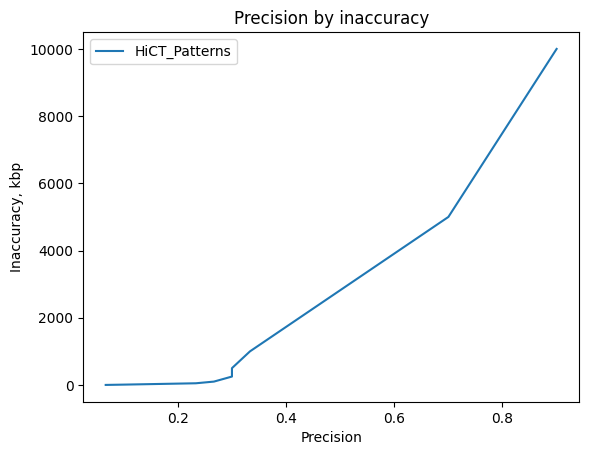

In [39]:
plt.title('Precision by inaccuracy')
plt.plot(precision_list_hict, inaccuracy_list, label = 'HiCT_Patterns')
plt.ylabel('Inaccuracy, kbp')
plt.xlabel('Precision')
plt.legend()
plt.show()

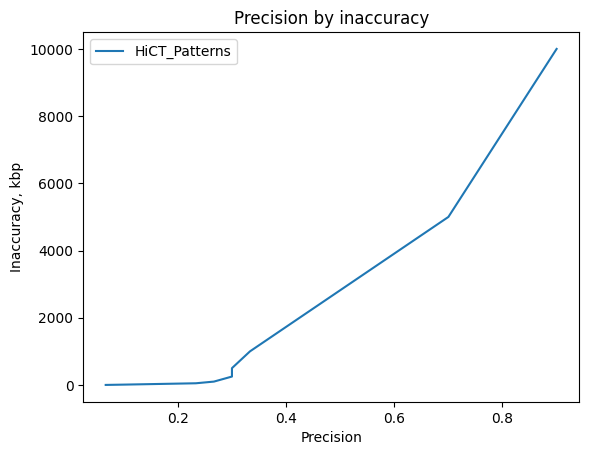

In [50]:
plt.title('Precision by inaccuracy')
plt.plot(precision_list_hict, inaccuracy_list, label = 'HiCT_Patterns')
plt.ylabel('Inaccuracy, kbp')
plt.xlabel('Precision')
plt.legend()
plt.show()

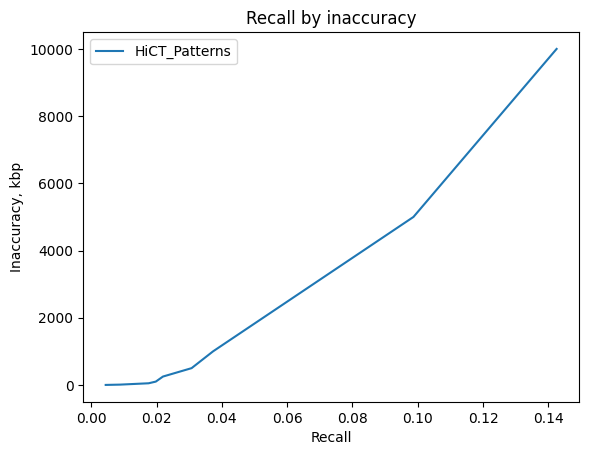

In [29]:
plt.title('Recall by inaccuracy')
plt.plot(recall_list_hict, inaccuracy_list, label = 'HiCT_Patterns')
plt.ylabel('Inaccuracy, kbp')
plt.xlabel('Recall')
plt.legend()
plt.show()

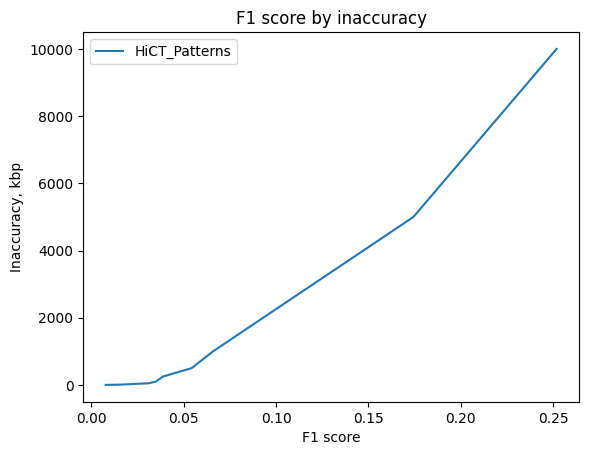

In [30]:
plt.title('F1 score by inaccuracy')
plt.plot(f1_list_hict, inaccuracy_list, label = 'HiCT_Patterns')
plt.ylabel('Inaccuracy, kbp')
plt.xlabel('F1 score')
plt.legend()
plt.show()

HiCT, 1 kbp


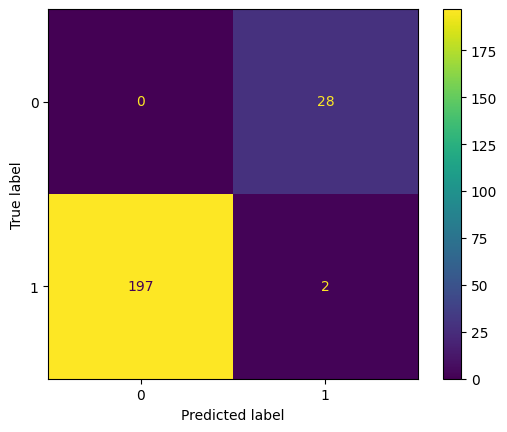

HiCT, 10 kbp


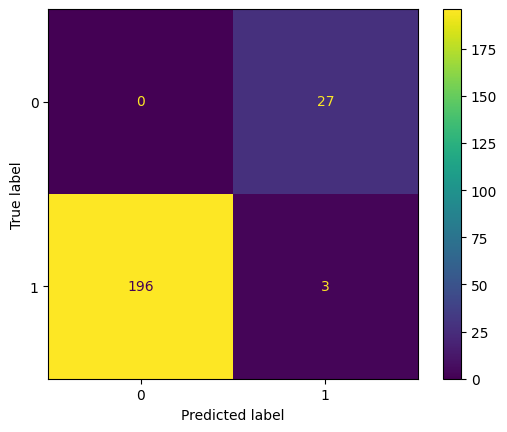

HiCT, 50 kbp


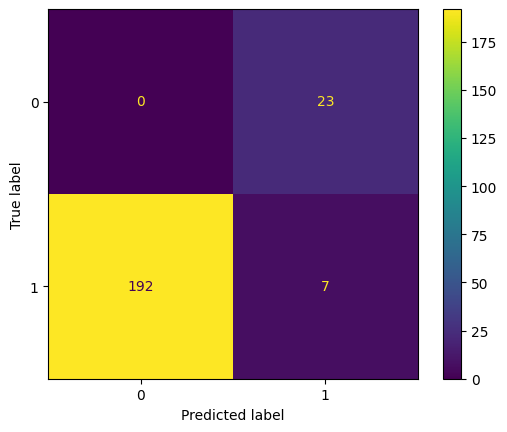

HiCT, 100 kbp


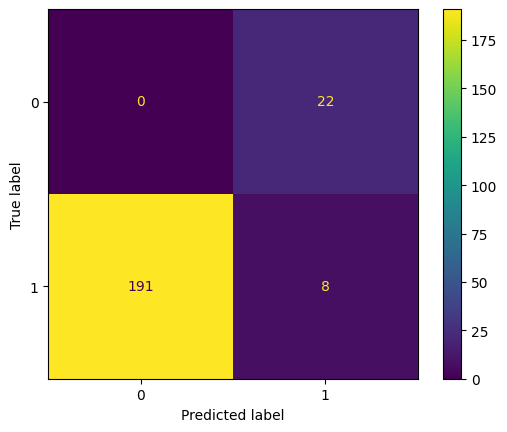

HiCT, 250 kbp


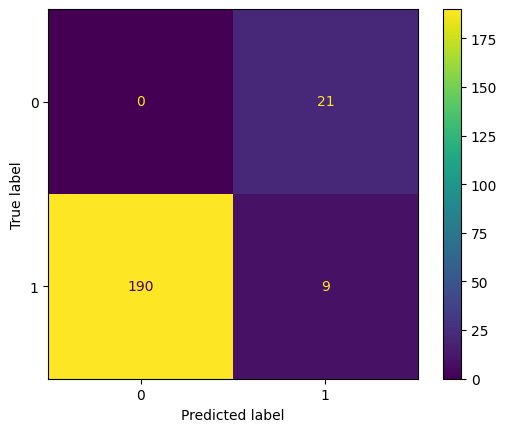

HiCT, 500 kbp


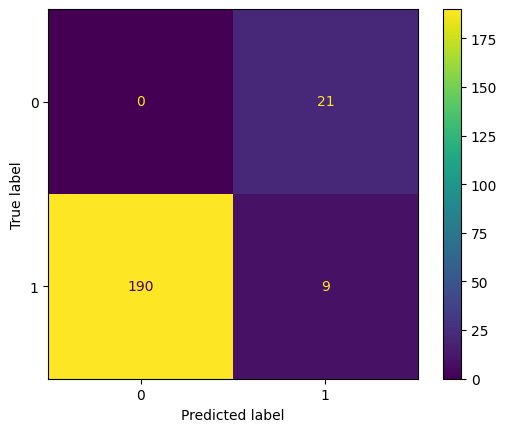

HiCT, 1000 kbp


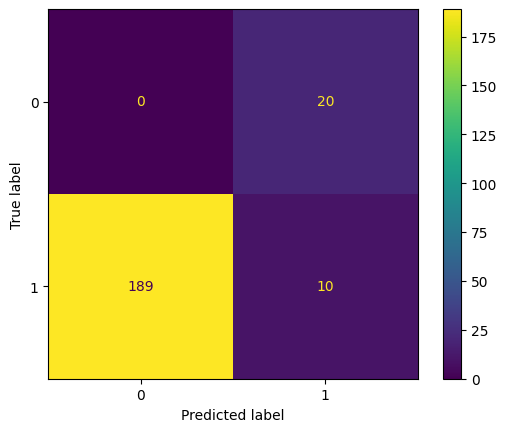

HiCT, 5000 kbp


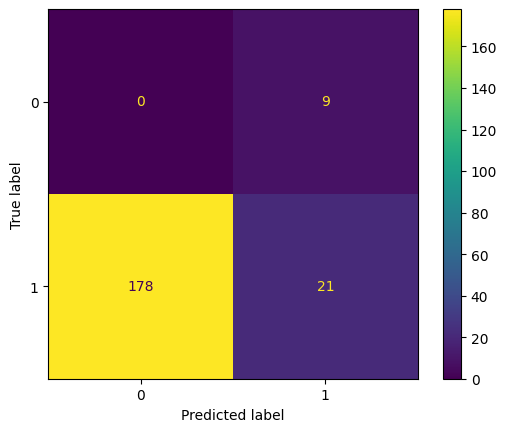

HiCT, 10000 kbp


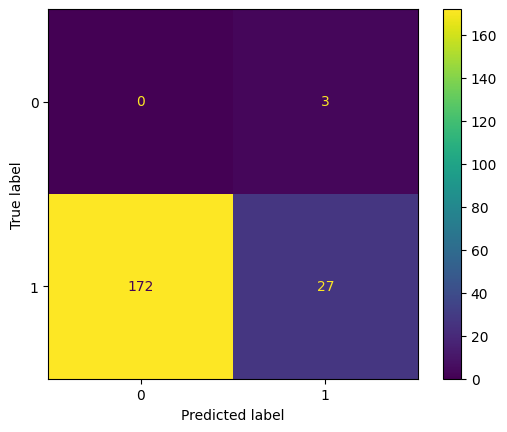

In [40]:
print_conf_matrices(tp_list_hict, fn_list_hict, tn_list_hict, fp_list_hict, inaccuracy_list, 'HiCT')

## Normalizations

In [137]:
coords_set = {}
c = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/5000")

for coord in np.genfromtxt(f'{local_path}data/apes/stage3_real_50k.csv', delimiter=",", dtype=int):
    if c.chromnames[coord[0]] in coords_set:
        coords_set[c.chromnames[coord[0]]].append((coord[2], coord[3]))
    else:
        coords_set[c.chromnames[coord[0]]] = [((coord[2], coord[3]))]
coords_set

{'chr1': [(4152, 1248),
  (4152, 3336),
  (4152, 1368),
  (4152, 3480),
  (4152, 1488),
  (4152, 3648),
  (4152, 3816),
  (4152, 3936),
  (4152, 4032),
  (4152, 1992),
  (4152, 4104),
  (4152, 192),
  (4152, 240),
  (4152, 288),
  (4152, 2400),
  (4152, 2448),
  (4152, 2496),
  (4152, 2544),
  (4152, 528),
  (4152, 576),
  (4152, 648),
  (4152, 696),
  (4152, 2760),
  (4152, 744),
  (4152, 2808),
  (4152, 2976),
  (4152, 3120),
  (4200, 1248),
  (4200, 3336),
  (4200, 1368),
  (4200, 3480),
  (4200, 1488),
  (4200, 3648),
  (4200, 3816),
  (4200, 3936),
  (4200, 4032),
  (4200, 1992),
  (4200, 4104),
  (4200, 192),
  (4200, 240),
  (4200, 288),
  (4200, 2400),
  (4200, 2448),
  (4200, 2496),
  (4200, 2544),
  (4200, 528),
  (4200, 576),
  (4200, 648),
  (4200, 696),
  (4200, 2760),
  (4200, 744),
  (4200, 2808),
  (4200, 2976),
  (4200, 3120),
  (4248, 1248),
  (4248, 3336),
  (4248, 1368),
  (4248, 3480),
  (4248, 1488),
  (4248, 3648),
  (4248, 3816),
  (4248, 3936),
  (4248, 4032),


In [131]:
c = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/5000")

results = np.genfromtxt(f'{local_path}data/apes/stage1_real_50k.csv', delimiter=",")
#results['chr'] = results['chr'].apply(lambda x: c.chromnames[int(x)])
results = get_chromosome_coords_double(results, c.chromsizes, c.chromnames, 50000)
results_dict = {}
for result in results:
    if result[0] in results_dict:
        results_dict[result[0]].append((result[2], result[3]))
    else:
        results_dict[result[0]] = [(result[2], result[3]), ]
coords_set = results_dict

In [ ]:
coords_list = pd.read_csv(f'{local_path}coords_list.csv')
coords_set = {}
for coord_chr, coord_pos in zip(list(coords_list['0']), list(coords_list['1'])):
    coord_str = coord_chr.removeprefix('(').removesuffix(')').split(', ')
    pos_str = coord_pos.removeprefix('(').removesuffix(')').split(', ')
    if int(coord_str[0]) == int(coord_str[1]):
        if coord_str[0] in coords_set:
            coords_set[coord_str[0]].append((int(pos_str[0]), int(pos_str[1])))
        else:
            coords_set[coord_str[0]] = [(int(pos_str[0]), int(pos_str[1]))]

coords_set

## Log change subtraction metrics

In [136]:
from os import listdir
resolution = 50000

undetectable = [file.removesuffix('.png').split('_')[2:] for file in listdir('D:\Study\HICT\images\images_log_change_size_undetectable')]
undetectable_dict = {}
for chr_x_y in undetectable:
    chr, x, y = chr_x_y
    if chr in undetectable_dict:
        undetectable_dict[chr].append((int(x)*5000//resolution, int(y)*5000//resolution))
    else:
        undetectable_dict[chr] = [(int(x)*5000//resolution, int(y)*5000//resolution),]
undetectable_dict

{'chr10': [(547, 1604)],
 'chr11': [(1783, 1792)],
 'chr12': [(948, 949)],
 'chr13': [(1028, 1033), (1265, 1282)],
 'chr14': [(288, 789)],
 'chr15': [(1603, 1607), (383, 384), (413, 416)],
 'chr16': [(240, 243), (321, 324), (323, 331)],
 'chr17': [(1217, 1219), (940, 942)],
 'chr1': [(2937, 2949),
  (2950, 2954),
  (4296, 4543),
  (4554, 4786),
  (4833, 4842),
  (502, 505)],
 'chr20': [(991, 993)],
 'chr22': [(430, 439), (435, 439)],
 'chr2': [(2611, 2639)],
 'chr3': [(1804, 1805), (4008, 4012), (4010, 4012)],
 'chr4': [(1106, 1452), (2453, 2455), (2709, 2710)],
 'chr5': [(579, 752)],
 'chr6': [(1309, 1315),
  (1312, 1331),
  (1312, 1343),
  (1314, 1323),
  (1328, 1331),
  (1331, 1341)],
 'chr7': [(120, 138), (1287, 1291), (1369, 1370), (790, 883)],
 'chr8': [(629, 1707)],
 'chr9': [(1994, 1999), (2000, 2002), (647, 671)],
 'chrX': [(1043, 1045),
  (2368, 2371),
  (2668, 2671),
  (2956, 2959),
  (3018, 3021),
  (3027, 3031),
  (3051, 3052),
  (3055, 3057),
  (68, 69)],
 'chrY': [(128, 

In [138]:
c = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/{resolution}")
c_clean = cooler.Cooler(f"{local_path}data\human\CHM13_4DN.mcool::/resolutions/{resolution}")

gor = data.loc[(data.Species == 'Jim_GGO')].copy()
species = 'Gor_CHM13'

gor['astart_res'] = gor['T2T Chm13\n RefStart'] // resolution
gor['bstart_res'] = gor['QueStart'] // resolution
gor['aend_res'] =  gor['T2T Chm13\n RefEnd'] // resolution
gor['bend_res'] = gor['QueEnd'] // resolution
gor['species']=species
gor['QueChrom_tmp'] = gor['QueChrom_tmp'].map(lambda x: x.rstrip('_hap1').rstrip('_hap2'))
gor = gor.rename(columns={'T2T Chm13 RefChrom': 'achr', 'QueChrom_tmp': 'bchr'})
gor.reset_index(inplace=True)
tp_sum = 0
fp_sum = 0
fn_sum = 0
und_count = 0
for chr_name in c.chromnames:
    chr_num = c.chromnames.index(chr_name)
    if c.chromnames[int(chr_num)] in undetectable_dict:
        und = undetectable_dict[c.chromnames[int(chr_num)]]
    else:
        und = []
    #matrix = c.matrix(balance=False).fetch(c.chromnames[int(chr_num)])
    #matrix_clean = c_clean.matrix(balance=False).fetch(c.chromnames[int(chr_num)])
    if chr_name not in coords_set:
        coords = []
    else:
        coords = coords_set[chr_name]
    xs = [coord[0] for coord in coords]
    ys = [coord[1] for coord in coords]
    masked_found_x = np.zeros(len(xs), dtype=bool)
    masked_found_y = np.zeros(len(ys), dtype=bool)
    gor_cur = gor[(gor.achr == c.chromnames[int(chr_num)])]

    tp = 0
    fp = len(coords)*2
    fn = len(gor_cur)*2
    for answer_x, answer_y in zip(gor_cur.astart_res, gor_cur.aend_res):
        undedect = False
        found_x = False
        found_y = False
        for x, y in und:
            if abs(answer_x-x)<2 and abs(answer_y-y)<2:
                fn-=2
                und_count+=1
                undedect = True
                break
        if undedect:
            continue

        for i, x, y in zip(range(len(xs)) ,xs, ys):
            if abs(answer_x - y) < 100 and not masked_found_x[i] and not found_x:
                tp+=1
                fp-=1
                fn-=1
                masked_found_x[i] = True
                found_x = True
            if abs(answer_y - x) < 100 and not masked_found_y[i] and not found_y:
                tp+=1
                fp-=1
                fn-=1
                masked_found_y[i] = True
                found_y = True
    #print('tp', tp)
    #print('fp', fp)
    #print('fn', fn)

    tp_sum+=tp
    fp_sum+=fp
    fn_sum+=fn
print('tp_sum', tp_sum)
print('fp_sum', fp_sum)
print('fn_sum', fn_sum)
print(und_count)

tp_sum 176
fp_sum 84056
fn_sum 98
62


In [17]:
def get_chromosome_coords_double(coords_list, chr_sizes, chromnames, resolution):
    additive_sizes = np.empty_like(chr_sizes, dtype=np.uint64)
    curr_s = 0
    for i, s in enumerate(chr_sizes):
        curr_s += s
        additive_sizes[i] = curr_s
    result = {}
    for coord_x, coord_y in coords_list:
        x_i = 0
        while coord_x*resolution > additive_sizes[x_i]:
            x_i+=1
            if x_i >= len(additive_sizes):
                break
        if x_i >= len(additive_sizes):
            continue
        x_chr = x_i
        if x_i > 0:
            x = (coord_x*resolution-additive_sizes[x_i-1]) // resolution
        else:
            x = coord_x

        y_i = 0
        while coord_y*resolution > additive_sizes[y_i]:
            y_i+=1
            if y_i >= len(additive_sizes):
                break
        if y_i >= len(additive_sizes):
            continue
        y_chr = y_i
        if y_i > 0:
            y = (coord_y*resolution-additive_sizes[y_i-1]) // resolution
        else:
            y = coord_y

        
        if (x_chr, y_chr) in result:
            result[(x_chr, y_chr)].append((x, y))
        else:
            result[(x_chr, y_chr)] = [(x, y), ]
        
    result_list = []
    
    for key, value in result.items():
        for v in value:
            result_list.append((chromnames[key[0]],chromnames[key[1]], int(v[0]), int(v[1])))
    return result_list

In [82]:
c = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/{resolution}")
resolution = 50000
answers = pd.read_csv(f'{local_path}data/apes/mGorGor.pri_sv_2.csv')
answers['chr'] = answers['chr'].apply(lambda x: x.split('_')[0])

results = np.genfromtxt(f'{local_path}data/apes/stage1_50k.csv', delimiter=",")
#results['chr'] = results['chr'].apply(lambda x: c.chromnames[int(x)])
results = get_chromosome_coords_double(results, c.chromsizes, c.chromnames, resolution)
results_dict = {}
for result in results:
    if result[0] in results_dict:
        results_dict[result[0]].append((result[2], result[3]))
    else:
        results_dict[result[0]] = [(result[2], result[3]), ]


In [87]:
c = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/{resolution}")
resolution = 50000
answers = pd.read_csv(f'{local_path}data/apes/mGorGor.pri_sv_2.csv')
answers['chr'] = answers['chr'].apply(lambda x: x.split('_')[0])

results = np.genfromtxt(f'{local_path}data/apes/stage3_50k.csv', delimiter=",")
results_dict = {}
for result in results:
    if c.chromnames[int(result[0])] in results_dict:
        results_dict[c.chromnames[int(result[0])]].append((result[2], result[3]))
    else:
        results_dict[c.chromnames[int(result[0])]] = [(result[2], result[3]), ]


In [88]:

tp_sum = 0
fp_sum = 0
fn_sum = 0
for cur_chr in set(answers['chr']):
    ans = answers[answers['chr'] == cur_chr]
    if not cur_chr in results_dict:
        fn_sum+=len(ans)*2
        continue
    results_chr = results_dict[cur_chr]

    tp = 0
    fp = len(results_chr) * 2
    fn = len(ans) * 2
    masked_found = np.zeros(len(results_chr), dtype=bool)
    for answer_x, answer_y in zip(ans.start, ans.end):
        found_x = False
        found_y = False
        for i, x_y in enumerate(results_chr):
            x = x_y[0]
            y = x_y[1]
            if abs(answer_x//resolution - x) < 100 and not found_x:
                tp+=1
                if not masked_found[i]:
                    fp-=1
                fn-=1
                found_x = True
                masked_found[i] = True
            if abs(answer_y//resolution - y) < 100 and not found_y:
                tp+=1
                if not masked_found[i]:
                    fp-=1
                fn-=1
                found_y = True
                masked_found[i] = True


    tp_sum+=tp
    fp_sum+=fp
    fn_sum+=fn
print('tp_sum', tp_sum)
print('fp_sum', fp_sum)
print('fn_sum', fn_sum)

tp_sum 1830
fp_sum 12470
fn_sum 1778


In [ ]:
c = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/5000")

answers = pd.read_csv(f'{local_path}data/apes/mGorGor.pri_sv_2.csv')
answers['chr'] = answers['chr'].apply(lambda x: x.split('_')[0])

results = pd.read_csv(f'{local_path}data/apes/mGorGor.pri_sv_2_stage3_10k.csv')
results['chr'] = results['chr'].apply(lambda x: c.chromnames[int(x)])

tp_sum = 0
fp_sum = 0
fn_sum = 0
for cur_chr in set(answers['chr']):
    ans = answers[answers['chr'] == cur_chr]
    results_chr = results[results['chr'] == cur_chr]

    tp = 0
    fp = len(results_chr)
    fn = len(ans)
    for answer_x, answer_y in zip(ans.start, ans.end):
        for x, y in zip(results_chr.x, results_chr.y):
            if abs(answer_x//10000 - x) < 100 and abs(answer_y//10000 - y) < 100:
                tp+=1
                fp-=1
                break

    tp_sum+=tp
    fp_sum+=fp
    fn_sum+=fn
print('tp_sum', tp_sum)
print('fp_sum', fp_sum)
print('fn_sum', fn_sum)

tp_sum 1
fp_sum 2
fn_sum 1804


: 

C:\Users\vit\AppData\Local\Temp\ipykernel_10212\2609557929.py:34: RuntimeWarning: divide by zero encountered in log10
  f_matrix = np.log10(matrix) - np.log10(matrix_clean)
C:\Users\vit\AppData\Local\Temp\ipykernel_10212\2609557929.py:34: RuntimeWarning: invalid value encountered in subtract
  f_matrix = np.log10(matrix) - np.log10(matrix_clean)


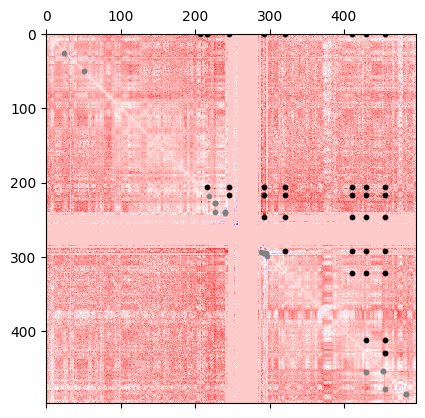

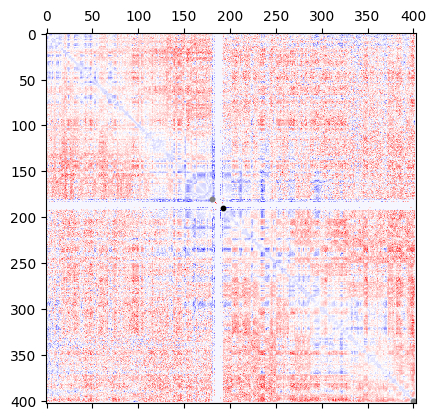

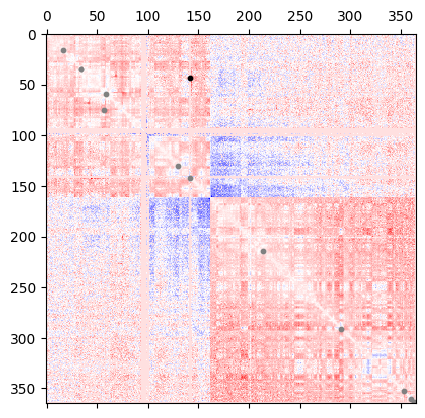

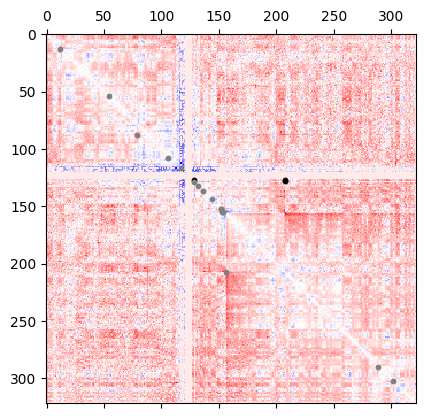

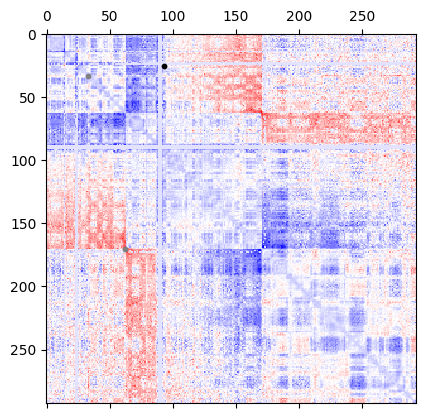

...

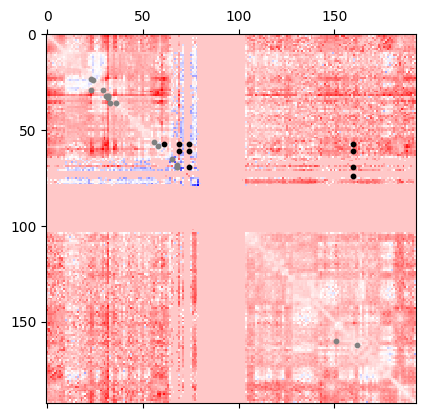

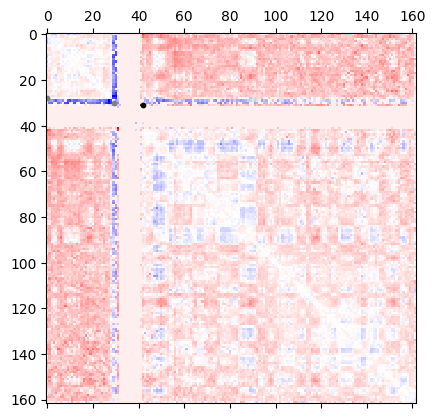

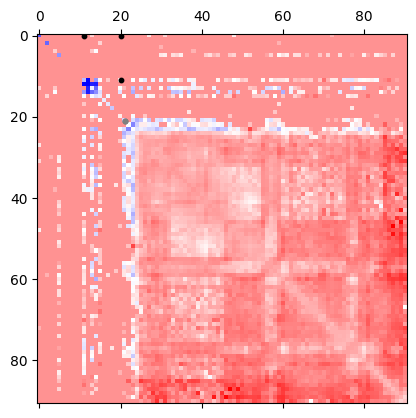

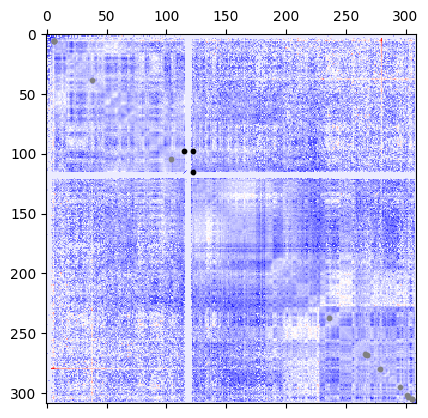

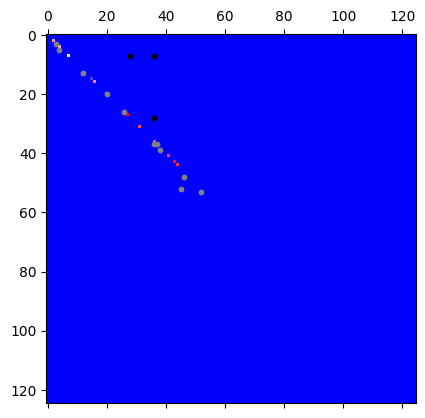

In [31]:
c = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/500000")
c_clean = cooler.Cooler(f"{local_path}data\human\CHM13_4DN.mcool::/resolutions/500000")

gor = data.loc[(data.Species == 'Jim_GGO')].copy()
species = 'Gor_CHM13'

gor['astart_res'] = gor['T2T Chm13\n RefStart'] // 500000
gor['bstart_res'] = gor['QueStart'] // 500000
gor['aend_res'] =  gor['T2T Chm13\n RefEnd'] // 500000
gor['bend_res'] = gor['QueEnd'] // 500000
gor['species']=species
gor['QueChrom_tmp'] = gor['QueChrom_tmp'].map(lambda x: x.rstrip('_hap1').rstrip('_hap2'))
gor = gor.rename(columns={'T2T Chm13 RefChrom': 'achr', 'QueChrom_tmp': 'bchr'})
gor.reset_index(inplace=True)

for chr_num in coords_set.keys():
    matrix = c.matrix(balance=False).fetch(c.chromnames[int(chr_num)])
    matrix_clean = c_clean.matrix(balance=False).fetch(c.chromnames[int(chr_num)])

    coords = coords_set[chr_num]
    xs = [coord[0]//50 for coord in coords]
    ys = [coord[1]//50 for coord in coords]

    gor_cur = gor[(gor.achr == c.chromnames[int(chr_num)])]

    nan_mask = np.isnan(matrix)
    zero_mask = np.zeros_like(matrix, dtype=bool)
    zero_mask[matrix==0] = True

    nan_mask_clean = np.isnan(matrix_clean)
    zero_mask_clean = np.zeros_like(matrix_clean, dtype=bool)
    zero_mask_clean[matrix_clean==0] = True

    f_matrix = np.log10(matrix) - np.log10(matrix_clean)
    f_matrix+=1e-6
    f_matrix[nan_mask] = 0
    f_matrix[zero_mask] = 0
    f_matrix[nan_mask_clean] = 0
    f_matrix[zero_mask_clean] = 0
    f_matrix = 2.*(f_matrix - np.min(f_matrix))/np.ptp(f_matrix)-1

    fig = plt.figure()
    ax = fig.add_subplot(111)
    im = ax.matshow(f_matrix, cmap='bwr')
    ax.scatter(xs, ys,s=10, c='Black')
    ax.scatter(gor_cur.astart_res, gor_cur.aend_res,s=10, c='Grey')

    plt.show()

C:\Users\vit\AppData\Local\Temp\ipykernel_13232\1567775985.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gor['astart_res'] = gor['T2T Chm13\n RefStart'] // resolution
C:\Users\vit\AppData\Local\Temp\ipykernel_13232\1567775985.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gor['bstart_res'] = gor['QueStart'] // resolution
C:\Users\vit\AppData\Local\Temp\ipykernel_13232\1567775985.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row

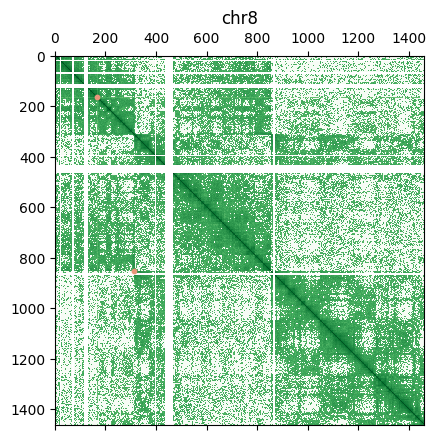

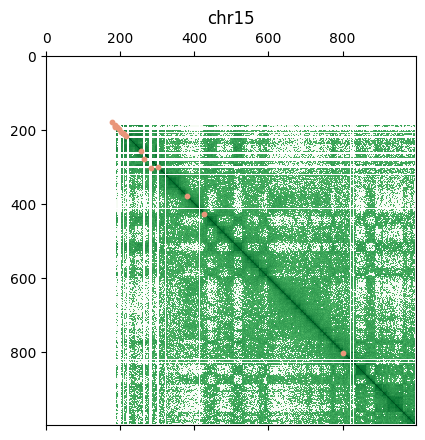

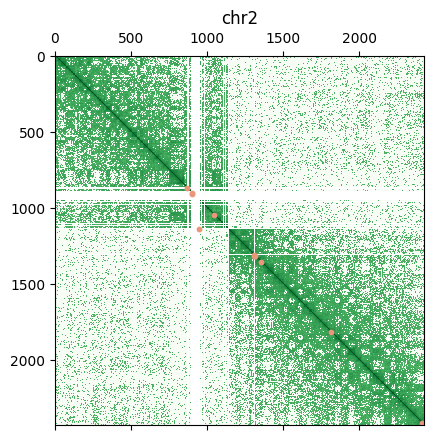

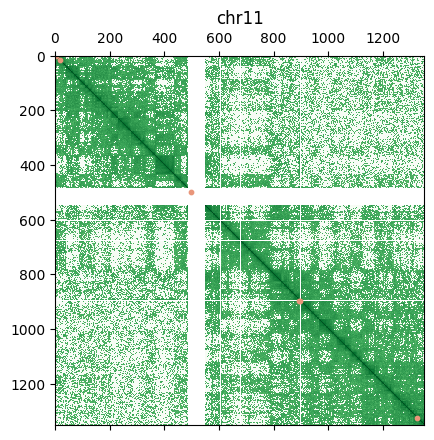

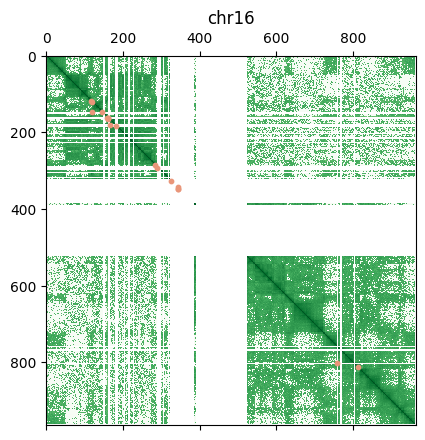

...

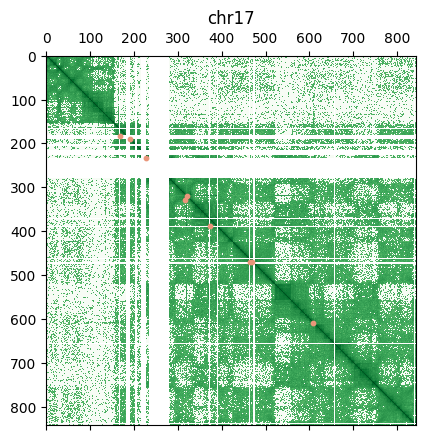

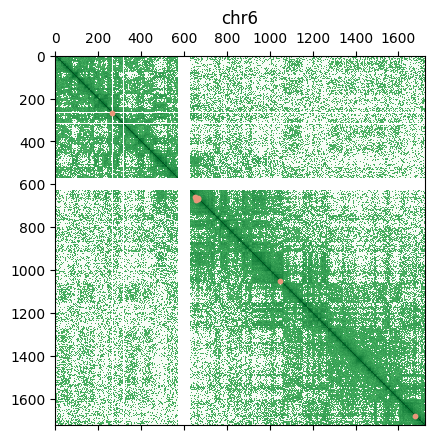

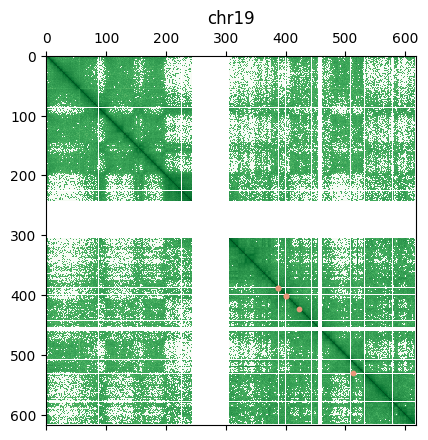

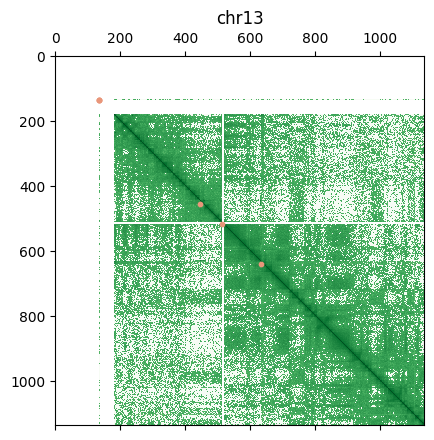

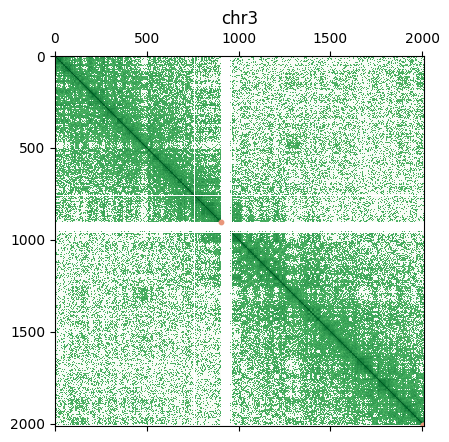

In [33]:
united_hict = {
    'species':[],
    'chrom':[],
    'bp':[],
}
resolution = 100000
species = 'Gor_CHM13'

c = cooler.Cooler(f'D:\Study\Hi-C_data\{species}_4DN.mcool::/resolutions/{resolution}')
gor = data.loc[(data.Species == 'Jim_GGO')]
gor['astart_res'] = gor['T2T Chm13\n RefStart'] // resolution
gor['bstart_res'] = gor['QueStart'] // resolution
gor['aend_res'] =  gor['T2T Chm13\n RefEnd'] // resolution
gor['bend_res'] = gor['QueEnd'] // resolution
gor['species']=species
gor['QueChrom_tmp'] = gor['QueChrom_tmp'].map(lambda x: x.rstrip('_hap1').rstrip('_hap2'))
gor = gor.rename(columns={'T2T Chm13 RefChrom': 'achr', 'QueChrom_tmp': 'bchr'})
gor.reset_index(inplace=True)
for chr_name in set(gor.achr):
    chr_number = 0
    matrix = np.log10(c.matrix(balance=True).fetch(chr_name)+0.000000001)
    gor_cur = gor[(gor.achr == chr_name)]
    fig = plt.figure()
    ax = fig.add_subplot(111)
    im = ax.matshow(matrix, cmap='Greens')
    ax.scatter(gor_cur.astart_res, gor_cur.aend_res,s=10, c='#E9967A')
    plt.title(chr_name)
    plt.show()

## Matrix subtraction

In [15]:
def remove_residual_signal(matrix):
    mean = np.nanmean(matrix.diagonal(0))
    matrix[np.abs(matrix)<mean] = 0
    return matrix

In [ ]:
resolution = 50000

ape_chm = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/{resolution}")
chm =  cooler.Cooler(f"{local_path}data\human\CHM13_4DN.mcool::/resolutions/{resolution}")

gor = data.loc[(data.Species == 'Jim_GGO')]
species = 'Gor_CHM13'

gor['astart_res'] = gor['T2T Chm13\n RefStart'] // resolution
gor['bstart_res'] = gor['QueStart'] // resolution
gor['aend_res'] =  gor['T2T Chm13\n RefEnd'] // resolution
gor['bend_res'] = gor['QueEnd'] // resolution
gor['species']=species
gor['QueChrom_tmp'] = gor['QueChrom_tmp'].map(lambda x: x.rstrip('_hap1').rstrip('_hap2'))
gor = gor.rename(columns={'T2T Chm13 RefChrom': 'achr', 'QueChrom_tmp': 'bchr'})
gor.reset_index(inplace=True)


### SV sizes hist

C:\Users\vit\AppData\Local\Temp\ipykernel_17536\263131359.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gor['QueChrom_tmp'] = gor['QueChrom_tmp'].map(lambda x: x.rstrip('_hap1').rstrip('_hap2'))


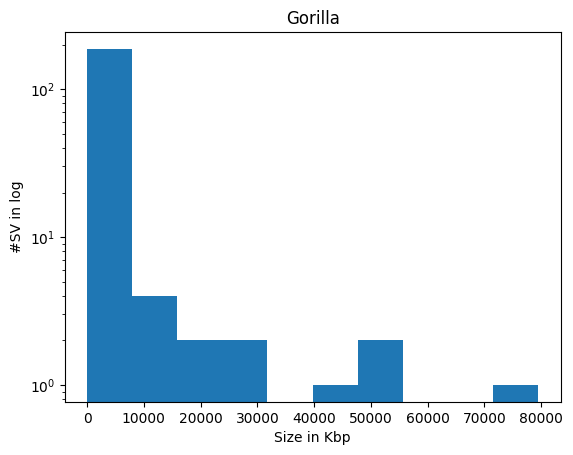

In [32]:
gor = data.loc[(data.Species == 'Jim_GGO')]
species = 'Gor_CHM13'

gor['QueChrom_tmp'] = gor['QueChrom_tmp'].map(lambda x: x.rstrip('_hap1').rstrip('_hap2'))
gor = gor.rename(columns={'T2T Chm13 RefChrom': 'achr', 'QueChrom_tmp': 'bchr', 'T2T Chm13\n RefStart':'start', 'T2T Chm13\n RefEnd':'end'})
gor.reset_index(inplace=True)

sizes = [(row.end - row.start)//1000 for index, row in gor.iterrows()]

plt.hist(sizes, log=True)
plt.title('Gorilla')
plt.xlabel('Size in Kbp')
plt.ylabel('#SV in log')
plt.show() 

In [18]:
resolution = 50000

ape_chm = cooler.Cooler(f"D:\Study\HICT\HICT_Patterns\data/apes\Gor_SV_4DN.mcool::/resolutions/{resolution}")
chm =  cooler.Cooler(f"D:/Study/Hi-C_data/Gor_4DN.mcool::/resolutions/{resolution}")

gor = data.loc[(data.Species == 'Jim_GGO')]
species = 'Gor_CHM13'

gor['astart_res'] = gor['T2T Chm13\n RefStart'] // resolution
gor['bstart_res'] = gor['QueStart'] // resolution
gor['aend_res'] =  gor['T2T Chm13\n RefEnd'] // resolution
gor['bend_res'] = gor['QueEnd'] // resolution
gor['species']=species
gor['QueChrom_tmp'] = gor['QueChrom_tmp'].map(lambda x: x.rstrip('_hap1').rstrip('_hap2'))
gor = gor.rename(columns={'T2T Chm13 RefChrom': 'achr', 'QueChrom_tmp': 'bchr'})
gor.reset_index(inplace=True)

C:\Users\vit\AppData\Local\Temp\ipykernel_18716\2553480064.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gor['astart_res'] = gor['T2T Chm13\n RefStart'] // resolution
C:\Users\vit\AppData\Local\Temp\ipykernel_18716\2553480064.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gor['bstart_res'] = gor['QueStart'] // resolution
C:\Users\vit\AppData\Local\Temp\ipykernel_18716\2553480064.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_

C:\Users\vit\AppData\Local\Temp\ipykernel_13068\4161612624.py:5: RuntimeWarning: divide by zero encountered in log10
  matrix = np.log10(matrix)-np.log10(matrix_clean)
C:\Users\vit\AppData\Local\Temp\ipykernel_13068\4161612624.py:5: RuntimeWarning: invalid value encountered in subtract
  matrix = np.log10(matrix)-np.log10(matrix_clean)


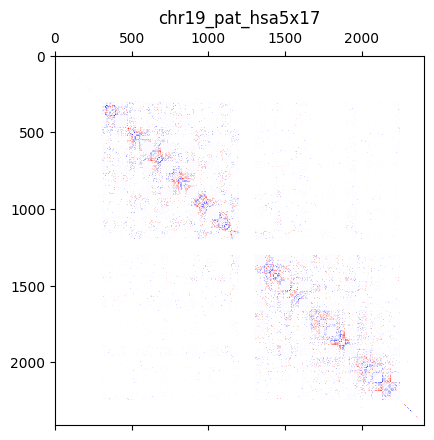

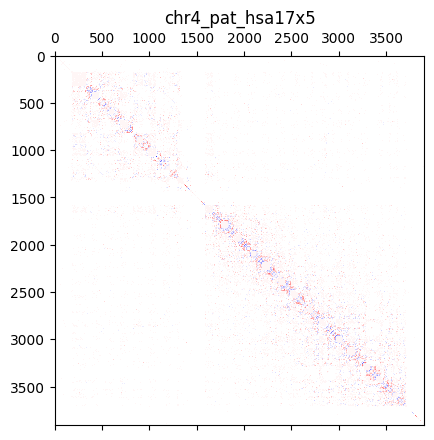

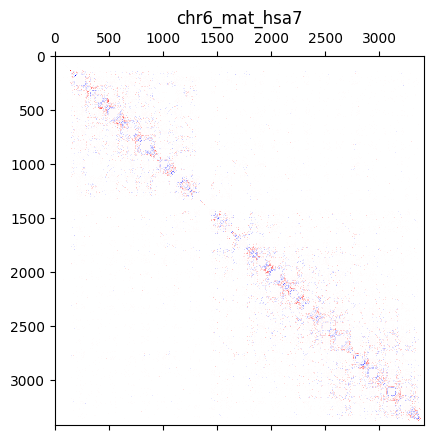

KeyboardInterrupt: 

In [ ]:
for chr_name in set(ape_chm.chromnames):
    chr_number = 0
    matrix = ape_chm.matrix(balance=False).fetch(chr_name) 
    matrix_clean = chm.matrix(balance=False).fetch(chr_name)
    matrix = np.log10(matrix)-np.log10(matrix_clean)
    #matrix = remove_residual_signal(matrix)
    gor_cur = gor[(gor.achr == chr_name)]
    fig = plt.figure()
    ax = fig.add_subplot(111)
    im = ax.matshow(matrix, cmap='bwr')
    ax.scatter(gor_cur.astart_res, gor_cur.aend_res,s=10, c='#E9967A')
    plt.title(chr_name)
    plt.show()

In [ ]:

for chr_name in set(gor.achr):
    chr_number = 0
    matrix = ape_chm.matrix(balance=False).fetch(chr_name) 
    matrix_clean = chm.matrix(balance=False).fetch(chr_name)
    matrix = np.log10(matrix)-np.log10(matrix_clean)
    #matrix = remove_residual_signal(matrix)
    gor_cur = gor[(gor.achr == chr_name)]
    fig = plt.figure()
    ax = fig.add_subplot(111)
    im = ax.matshow(matrix, cmap='Greens')
    ax.scatter(gor_cur.astart_res, gor_cur.aend_res,s=10, c='#E9967A')
    plt.title(chr_name)
    plt.show()

In [ ]:
for index, row in gor.iterrows():
    chr_name = row.achr
    matrix = ape_chm.matrix(balance=False).fetch(chr_name) 
    matrix_clean = chm.matrix(balance=False).fetch(chr_name)
    matrix = np.log10(matrix)-np.log10(matrix_clean*1.1629108287)

    matrix = matrix[row.astart_res-100:row.aend_res+100, row.astart_res-100:row.aend_res+100]

    
    fig = plt.figure()
    ax = fig.add_subplot(111)
    im = ax.matshow(matrix, cmap='bwr')
    plt.axhline(y = 100, color = 'r', linestyle = '-')
    plt.axvline(x = matrix.shape[0]-100, color = 'r', linestyle = '-') 
    plt.savefig(f'images/Gor_CHM13_{chr_name}_{row.astart_res}_{row.aend_res}.png')

## Filter out bad SV

In [8]:
import os
automated = [file.removesuffix('.png').split('_')[2:] for file in os.listdir('D:\Study\HICT\HICT_Patterns\images_filter_testing')]
automated_set = set()
for chr_x_y in automated:
    chr, x, y = chr_x_y
    automated_set.add(f"{chr}_{x}_{y}")

good = [file.removesuffix('.png').split('_')[2:] for file in os.listdir('D:\Study\HICT\HICT_Patterns\images_Gor_CHM13_5k(good)')]
good_set = set()
for chr_x_y in good:
    chr, x, y = chr_x_y
    good_set.add(f"{chr}_{int(x)//2}_{int(y)//2}")

good_set-automated_set

{'chr10_2737_8023',
 'chr10_3713_3714',
 'chr11_13265_13267',
 'chr11_174_177',
 'chr12_2098_6488',
 'chr12_2852_2854',
 'chr12_488_489',
 'chr14_1443_3949',
 'chr14_2873_2875',
 'chr14_6039_6041',
 'chr15_1916_1922',
 'chr15_2066_2080',
 'chr15_3793_3796',
 'chr15_4273_4275',
 'chr16_1609_1620',
 'chr16_1617_1655',
 'chr16_1678_1817',
 'chr16_8125_8127',
 'chr17_2278_2343',
 'chr17_3161_3297',
 'chr17_4702_4711',
 'chr1_21480_22715',
 'chr1_22668_22669',
 'chr1_22686_22690',
 'chr1_22774_23934',
 'chr22_2152_2197',
 'chr22_2178_2197',
 'chr22_2510_2511',
 'chr2_13055_13083',
 'chr2_13055_13198',
 'chr2_13523_13527',
 'chr2_18125_18126',
 'chr2_24117_24119',
 'chr4_13544_13547',
 'chr4_5530_7263',
 'chr5_10706_10707',
 'chr5_14568_14570',
 'chr5_18018_18021',
 'chr5_18168_18171',
 'chr5_2899_3764',
 'chr5_2965_2966',
 'chr5_6528_6530',
 'chr6_10507_10511',
 'chr6_16769_16772',
 'chr7_3953_4419',
 'chr7_601_694',
 'chr7_6435_6456',
 'chr7_7217_7219',
 'chr8_1655_1657',
 'chr8_3146_8539'

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "c:\Users\vit\.conda\envs\HICT\lib\asyncio\events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "c:\Users\vit\.conda\envs\HICT\lib\asyncio\selector_events.py", line 115, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] Удаленный хост принудительно разорвал существующее подключение
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "c:\Users\vit\.conda\envs\HICT\lib\asyncio\events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "c:\Users\vit\.conda\envs\HICT\lib\asyncio\selector_events.py", line 115, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] Удаленный хост принудит

In [25]:
count = 0
for index, row in gor.iterrows():
    chr_name = row.achr
    if abs(row.astart_res - row.aend_res) < 1:
        continue

    matrix = ape_chm.matrix(balance=False).fetch(chr_name) 
    matrix_clean = chm.matrix(balance=False).fetch(chr_name)
    f_matrix = np.log10(matrix+1e-6) - np.log10(matrix_clean+1e-6)
    f_matrix = 2.*(f_matrix - np.min(f_matrix))/np.ptp(f_matrix)-1
    f_matrix = f_matrix[row.astart_res-24:row.astart_res+24, row.aend_res-24:row.aend_res+24]
    matrix = np.log10(matrix)-np.log10(matrix_clean)

    matrix = matrix[row.astart_res-48:row.astart_res+48, row.aend_res-48:row.aend_res+48]

    if np.count_nonzero(np.nan_to_num(matrix, posinf=2, neginf=2))/9216 < 0.2:
        continue
    
    small_matrix = matrix[20:28, 20:28]

    if np.count_nonzero(np.nan_to_num(small_matrix, posinf=2, neginf=2))/64 < 0.2:
        continue

    fig = plt.figure()
    ax = fig.add_subplot(111)
    im = ax.matshow(matrix, cmap='bwr')

    for row in f_matrix:
        print(f'[{", ".join([str(el) for el in row])}],')
    plt.show()
    break
    count+=1

NameError: name 'gor' is not defined

In [3]:
from torch.utils.data import DataLoader, Dataset
import numpy as np
from tqdm import tqdm
import os
import sys
import pandas as pd
import warnings
import time
from torchvision.transforms import GaussianBlur

class TrainDatasetDiagonal(Dataset):
    def __init__(self, cooler_path_list, trans_csv_path_list, resolution, image_size, clean_cooler_list, detection=True, blur=True):
        sv_count = 0
        self.label_to_index = {'++':torch.tensor([0.0, 0.0, 0.0, 0.0, 1.0]),
                               '+-':torch.tensor([0.0, 0.0, 0.0, 1.0, 0.0]),
                               '-+':torch.tensor([0.0, 0.0, 1.0, 0.0, 0.0]),
                               '--':torch.tensor([0.0, 1.0, 0.0, 0.0, 0.0]),
                               'negative':torch.tensor([1.0, 0.0, 0.0, 0.0,  0.0])}
        self.resolution = resolution
        self.image_size = image_size
        self.detection = detection
        if blur:
            self.blur = GaussianBlur(kernel_size=3, sigma=1)
        self.use_blur = blur
                    
        print('Loaded clean cooler')
        indexes = {'file_index':[], 'in_index':[], 'is_sv':[]}
        self.coolers_list = []
        self.matrixes_list = []
        self.sv_files_list = []
        for trans_csv_path, cooler_path, clean_cooler_path, index in tqdm(zip(trans_csv_path_list, cooler_path_list, clean_cooler_list, range(len(trans_csv_path_list)))):
            sv_file = pd.read_csv(trans_csv_path)
            
            sv_count+=sv_file.shape[0]
            c = cooler.Cooler(f'{cooler_path}::/resolutions/{resolution}')
            c_clean = cooler.Cooler(f'{clean_cooler_path}::/resolutions/{resolution}')
            self.coolers_list.append(c)
            matrixes_by_chr = {}
            for chr in c.chromnames:
                matrix = c.matrix(balance=False).fetch(chr)
                matrix_clean = c_clean.matrix(balance=False).fetch(chr)

                f_matrix = np.log10(matrix+1e-6) - np.log10(matrix_clean+1e-6)

                matrixes_by_chr[chr] = f_matrix#torch.from_numpy(f_matrix).to(device=device, dtype=torch.float)
                    
            self.matrixes_list.append(matrixes_by_chr)
            neg_sv = {'chr':[], 'label':[], 'start':[], 'end':[]}
            for i, sv in sv_file.iterrows():
                indexes['file_index'].append(index)
                indexes['in_index'].append(i)
                indexes['is_sv'].append(True)
                
                chr_index = random.randint(0, len(c_clean.chromsizes)-1)
                chr_size = np.sum(c_clean.chromsizes[chr_index])
                x = random.randint(image_size//2*resolution, chr_size - image_size//2*resolution-1)
                y =  random.randint(image_size*resolution, 10*image_size*resolution)
                neg_sv['chr'].append(c_clean.chromnames[chr_index])
                neg_sv['label'].append('negative')
                neg_sv['start'].append(x)
                neg_sv['end'].append(x+y)

                indexes['file_index'].append(index)
                indexes['in_index'].append(sv_file.shape[0]+i)
                indexes['is_sv'].append(False)
            sv_file = pd.concat([sv_file, pd.DataFrame(neg_sv)])
            self.sv_files_list.append(sv_file)
        if detection:
            self.num_classes = 2
        else:     
            self.num_classes = len(self.sv_files_list[0].label.unique()) + 1
        self.indexes = pd.DataFrame(indexes)

    def __len__(self):
        return self.indexes.shape[0]*2

    def __getitem__(self, idx_d):
        idx = idx_d//2
        row = self.indexes.iloc[idx]
        sv_info = self.sv_files_list[row.file_index].iloc[row.in_index]
        c = self.coolers_list[row.file_index]
        matrix_full = self.matrixes_list[row.file_index][sv_info.chr]
        if idx_d % 2 == 0:
            x = (sv_info.start)//self.resolution
            y = (sv_info.start)//self.resolution
        else:
            x = (sv_info.end)//self.resolution
            y = (sv_info.end)//self.resolution
        pad = self.image_size//2
        if row.is_sv:
            x += random.randint(-pad//2, pad//2)
            y += random.randint(-pad//2, pad//2)    
        if x-pad < 0 or y - pad < 0:
            mv = max(-(x-pad), -(y-pad))
            x+=mv
            y+=mv
        if x+pad > matrix_full.shape[0] or y + pad > matrix_full.shape[0]:
            x = min(x,  matrix_full.shape[0]-pad-1)
            y = min(y,  matrix_full.shape[0]-pad-1)

        mat = matrix_full[x-pad:x+pad, y-pad:y+pad]
        mat = 2.*(mat - np.min(mat))/np.ptp(mat)-1
        mat = torch.from_numpy(mat).to(device=device, dtype=torch.float)
        #mat = torch.nan_to_num(mat)
        try:
            tens = mat.reshape((1, self.image_size, self.image_size)).to(device=device, dtype=torch.float)
        except RuntimeError:
            print(matrix_full.shape)
            print(x)
            print(y)
            print(sv_info.chr.iloc[0])
            print(row.is_sv)
        if self.use_blur:
            tens = self.blur(tens)
        if self.detection:
            return tens, 1 if row.is_sv else 0
        else:
            return tens, self.label_to_index[sv_info.label]

In [7]:
import torch
from torch import nn
import cooler
from torch.utils.data import DataLoader, Dataset
import numpy as np
from tqdm import tqdm
import os
import sys
import pandas as pd
import warnings
import time
from torchvision.transforms import GaussianBlur
import random
import torch.optim as optim
import math
import matplotlib.pyplot as plt

train_coolers = [f'{local_path}data/apes/Gor_SV_4DN.mcool',]
clean_train_coolers = [f'{local_path}data/apes/Gor_4DN.mcool',]
train_csvs = [f'{local_path}data/apes/mGorGor.pri_sv.csv',] 

train_dataset = TrainDatasetDiagonal(
    cooler_path_list=train_coolers,
    trans_csv_path_list=train_csvs,
    clean_cooler_list=clean_train_coolers,
    resolution=50000,
    image_size=48,
    detection=True,
    blur=False)
train_dataloader = DataLoader(train_dataset, batch_size=1, shuffle=False)

Loaded clean cooler


0it [00:00, ?it/s]C:\Users\vit\AppData\Local\Temp\ipykernel_10176\679972399.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  chr_size = np.sum(c_clean.chromsizes[chr_index])
1it [00:24, 24.05s/it]


In [7]:
import numpy as np

matrix =       np.array([[5, 0, np.nan],
                         [5, 4, np.nan],
                         [np.nan, 1, 0]])
matrix_clean = np.array([[5, 0, np.nan],
                         [5, np.nan, 0],
                         [4, 1, np.nan]])
matrix+=1e-6
matrix_clean+=1e-6
matrix[np.isnan(matrix)] = 0
matrix_clean[np.isnan(matrix_clean)] = 0
f_matrix = np.log10(matrix+1e-6) - np.log10(matrix_clean+1e-6)

f_matrix

array([[ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  6.60206021, -0.30103   ],
       [-6.60206021,  0.        ,  0.30103   ]])

## Real testing results step = 1

### Visualize on whole maps

In [3]:
resolution = 50000

c = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/{resolution}")
c_clean = cooler.Cooler(f"{local_path}data\human\CHM13_4DN.mcool::/resolutions/{resolution}")

gor = data.loc[(data.Species == 'Jim_GGO')].copy()
species = 'Gor_CHM13'

gor['astart_res'] = gor['T2T Chm13\n RefStart'] // 50000
gor['bstart_res'] = gor['QueStart'] // 50000
gor['aend_res'] =  gor['T2T Chm13\n RefEnd'] // 50000
gor['bend_res'] = gor['QueEnd'] // 50000
gor['species']=species
gor['QueChrom_tmp'] = gor['QueChrom_tmp'].map(lambda x: x.rstrip('_hap1').rstrip('_hap2'))
gor = gor.rename(columns={'T2T Chm13 RefChrom': 'achr', 'QueChrom_tmp': 'bchr'})
gor.reset_index(inplace=True)


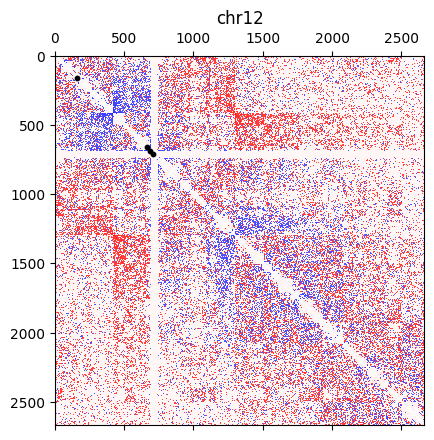

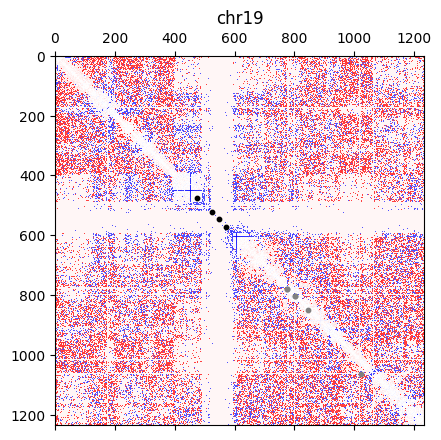

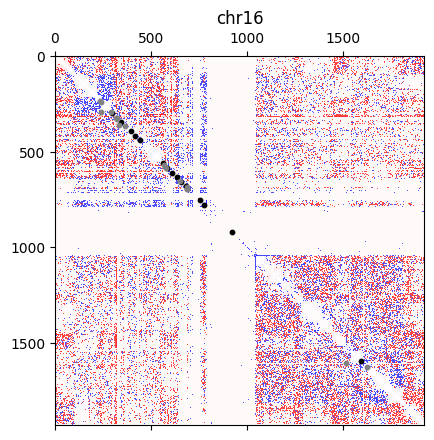

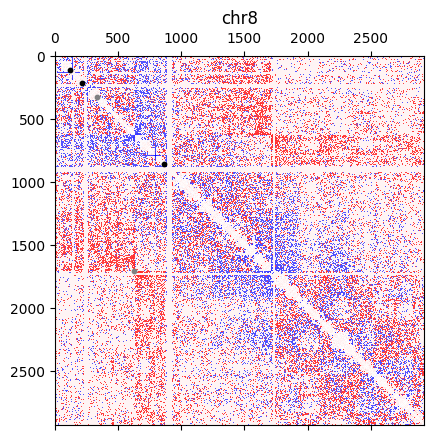

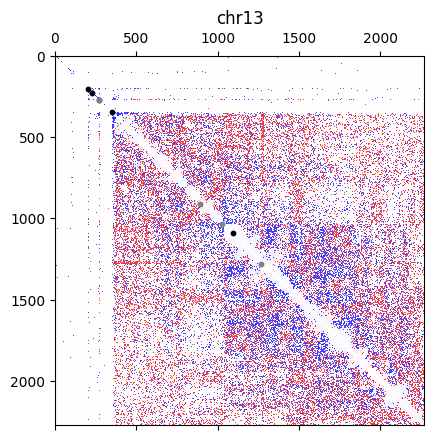

...

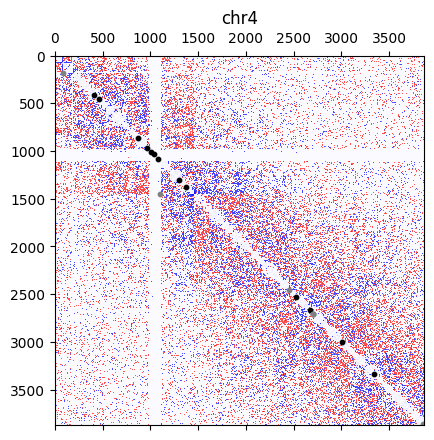

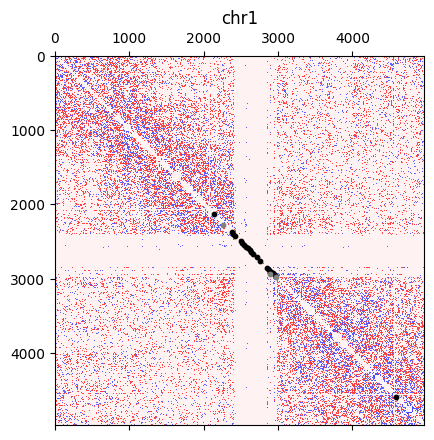

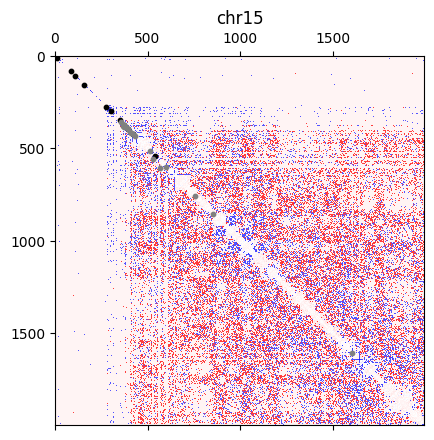

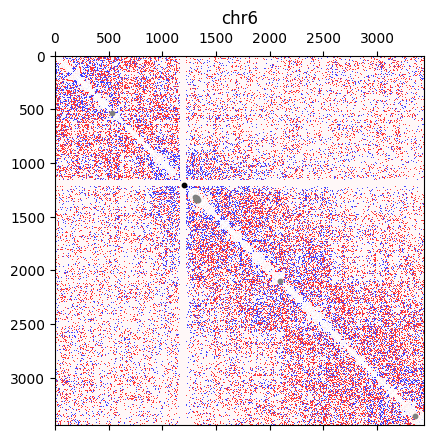

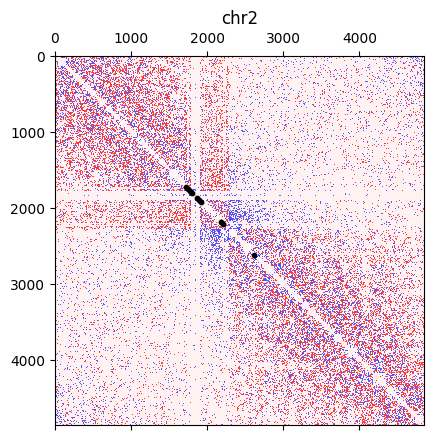

In [23]:

results = pd.read_csv(f"{local_path}data/apes/real_tests/step_24_50kb.csv")
result_res=50000

for cur_chr in set(gor.achr):
    matrix = c.matrix(balance=False).fetch(cur_chr)
    matrix_clean = c_clean.matrix(balance=False).fetch(cur_chr)
    bp =  [x*result_res//resolution for chr_number, x in get_chromosome_coords(results.bp_1, c.chromsizes, result_res) if chr_number==c.chromnames.index(cur_chr)]

    gor_cur = gor[(gor.achr == cur_chr) & (gor.bchr == cur_chr)]

    mat = np.log10(matrix+1e-6) - np.log10(matrix_clean+1e-6)
    mat = 2.*(mat - np.min(mat))/np.ptp(mat)-1

    fig = plt.figure()
    ax = fig.add_subplot(111)
    im = ax.matshow(mat, cmap='bwr')
    ax.scatter(bp, bp,s=10, c='Black')
    ax.scatter(gor_cur.astart_res, gor_cur.aend_res,s=10, c='Grey')
    plt.title(cur_chr)
    plt.show()
    plt.close()

### Calculate metrics

In [4]:
c = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/{resolution}")

additive_sizes = {}
curr_s = 0
for i, s in zip(c.chromnames, c.chromsizes):
    additive_sizes[i] = curr_s
    curr_s += s
    
def get_genome_coords_single(x, chr, resolution):
    pad_x = additive_sizes[str(chr)]
    x_new = x*resolution+pad_x
    return x_new // resolution

In [10]:
max_precision = 0
for result_path in ['step_1_10kb', 'step_1_50kb', 'step_1_25kb', 
                    'step_12_10kb', 'step_12_50kb', 'step_12_25kb',
                    'step_24_10kb', 'step_24_50kb', 'step_24_25kb',
                    'step_48_10kb', 'step_48_50kb', 'step_48_25kb']:
    results = pd.read_csv(f"{local_path}data/apes/real_tests/{result_path}.csv")
    result_res= int(result_path.split('_')[2].removesuffix('kb'))*1000
    image_size = 48
    bps = sorted(list(results.bp_1))
    segments = []
    segment_start = bps[0]
    segment_end = bps[0]
    for bp in bps:
        if bp-segment_end > image_size:
            segments.append((segment_start, segment_end))
            segment_start = bp
        segment_end = bp

    gor['wgc_x'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefStart'], row['achr'], 1), axis=1)
    gor['wgc_y'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefEnd'], row['achr'], 1), axis=1)
    answers_bp_x = sorted(list(gor.wgc_x))
    answers_bp_y = sorted(list(gor.wgc_y))
    answers_bp_x_hited = np.zeros(len(answers_bp_x))
    answers_bp_y_hited = np.zeros(len(answers_bp_y))

    hited_segements = np.zeros(len(segments))
    for i, segment in enumerate(segments):
        for i_x, bp_x in enumerate(answers_bp_x):
            if segment[0]-24<= bp_x//result_res <= segment[1]+24:
                hited_segements[i] = 1
                answers_bp_x_hited[i_x] += 1
        for i_y, bp_y in enumerate(answers_bp_y):
            if segment[0]-24<= bp_y//result_res <= segment[1]+24:
                hited_segements[i] = 1
                answers_bp_y_hited[i_y] += 1

    precision = sum(hited_segements)/len(hited_segements)
    print('\n===================================================')
    print(f"For strategy: step = {result_path.split('_')[1]}, resolution = {result_path.split('_')[2]}")
    print(f'Segments that have bp within: {sum(hited_segements)}')
    print(f'Total segments count: {len(hited_segements)}')
    print(f'Precision: {precision}')
    print(f'Found {sum(answers_bp_x_hited)+sum(answers_bp_y_hited)} from {2*len(answers_bp_x)} breakpoints')
    print('===================================================\n')
    if precision > max_precision:
        max_precision = precision
        best_strategy = f"step = {result_path.split('_')[1]}, resolution = {result_path.split('_')[2]}"
print(f"Best strategy: {best_strategy}\nWith precision = {max_precision}")


For strategy: step = 1, resolution = 10kb
Segments that have bp within: 122.0
Total segments count: 1423
Precision: 0.08573436401967674
Found 323.0 from 398 breakpoints


For strategy: step = 1, resolution = 50kb
Segments that have bp within: 60.0
Total segments count: 161
Precision: 0.37267080745341613
Found 241.0 from 398 breakpoints


For strategy: step = 1, resolution = 25kb
Segments that have bp within: 75.0
Total segments count: 225
Precision: 0.3333333333333333
Found 253.0 from 398 breakpoints


For strategy: step = 12, resolution = 10kb
Segments that have bp within: 117.0
Total segments count: 1174
Precision: 0.09965928449744463
Found 301.0 from 398 breakpoints


For strategy: step = 12, resolution = 50kb
Segments that have bp within: 38.0
Total segments count: 104
Precision: 0.36538461538461536
Found 157.0 from 398 breakpoints


For strategy: step = 12, resolution = 25kb
Segments that have bp within: 65.0
Total segments count: 197
Precision: 0.3299492385786802
Found 196.0 fro

In [6]:
results = pd.read_csv(f"{local_path}data/apes/real_tests/step_1_50kb.csv")
result_res=50000
image_size = 48
bps = sorted(list(results.bp_1))
segments = []
segment_start = bps[0]
segment_end = bps[0]
for bp in bps:
    if bp-segment_end > image_size:
        segments.append((segment_start, segment_end))
        segment_start = bp
    segment_end = bp

161


(array([118.,  22.,  11.,   4.,   1.,   1.,   1.,   1.,   0.,   2.]),
 array([  0. ,  59.6, 119.2, 178.8, 238.4, 298. , 357.6, 417.2, 476.8,
        536.4, 596. ]),
 <BarContainer object of 10 artists>)

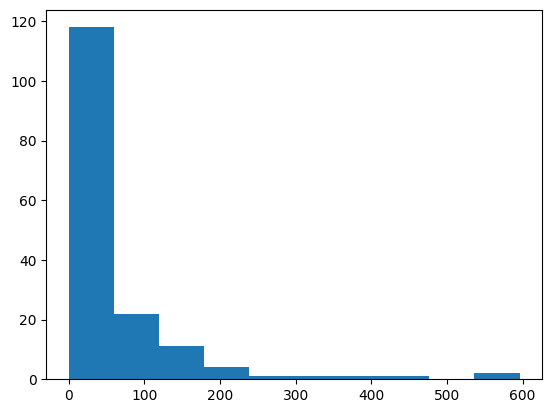

In [7]:
segments_len = [s[1]-s[0] for s in segments]
print(len(segments_len))
plt.hist(segments_len)

In [28]:
for result_path in [ 'step_1_50kb', 
                    'step_12_50kb', 
                    'step_24_50kb', 
                    'step_48_50kb',]:
    results = pd.read_csv(f"{local_path}data/apes/real_tests/{result_path}.csv")
    result_res=50000
    image_size = 48
    bps = sorted(list(results.bp_1))
    segments = []
    segment_start = bps[0]
    segment_end = bps[0]
    for bp in bps:
        if bp-segment_end > image_size:
            segments.append((segment_start, segment_end))
            segment_start = bp
        segment_end = bp
    
    segments_len = [s[1]-s[0] for s in segments]
    
    step = int(result_path.split('_')[1])
    gor['wgc_x'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefStart'], row['achr'], 1), axis=1)
    gor['wgc_y'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefEnd'], row['achr'], 1), axis=1)
    answers_bp_x = sorted(list(gor.wgc_x))
    answers_bp_y = sorted(list(gor.wgc_y))
    answers_bp_x_hited = np.zeros(len(answers_bp_x))
    answers_bp_y_hited = np.zeros(len(answers_bp_y))

    hited_segements = np.zeros(len(segments))
    for i, segment in enumerate(segments):
        for i_x, bp_x in enumerate(answers_bp_x):
            if (segment[0]-24-step)<= bp_x//result_res <= (segment[1]+24+step):
                hited_segements[i] = 1
                answers_bp_x_hited[i_x] += 1
        for i_y, bp_y in enumerate(answers_bp_y):
            if (segment[0]-24-step)<= bp_y//result_res <= (segment[1]+24+step):
                hited_segements[i] = 1
                answers_bp_y_hited[i_y] += 1

    print('\n===================================================')
    print(f"For strategy: step = {result_path.split('_')[1]}, resolution = {result_path.split('_')[2]}")
    print(f'Total segments count: {len(hited_segements)*result_res/sum(c.chromsizes)}')
    print(f'Total segments len: {sum(segments_len)}')

    print(f'Found {sum(answers_bp_x_hited)+sum(answers_bp_y_hited)} from {2*len(answers_bp_x)} breakpoints')
    print('===================================================\n')


For strategy: step = 1, resolution = 50kb
Total segments count: 0.0025823695114972015
Total segments len: 8475
Found 244.0 from 398 breakpoints


For strategy: step = 12, resolution = 50kb
Total segments count: 0.001668114467054093
Total segments len: 4512
Found 183.0 from 398 breakpoints


For strategy: step = 24, resolution = 50kb
Total segments count: 0.0013794023477562692
Total segments len: 2928
Found 175.0 from 398 breakpoints


For strategy: step = 48, resolution = 50kb
Total segments count: 0.000930294606626321
Total segments len: 1584
Found 157.0 from 398 breakpoints



# Check if segments step=12 inside segments step = 1

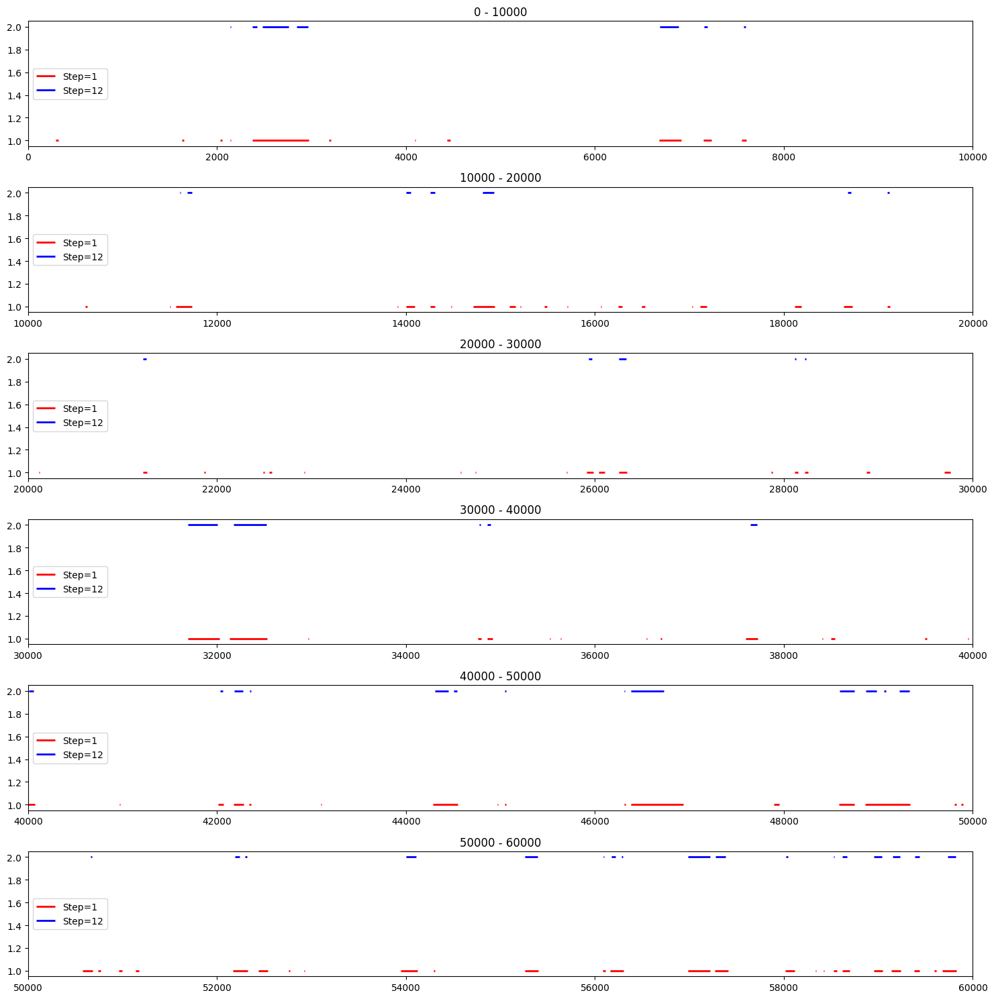

In [27]:
results = pd.read_csv(f"{local_path}data/apes/real_tests/step_1_50kb.csv")
result_res=50000
image_size = 48
bps = sorted(list(results.bp_1))
segments = []
segment_start = bps[0]
segment_end = bps[0]
for bp in bps:
    if bp-segment_end > image_size:
        segments.append((segment_start, segment_end))
        segment_start = bp
    segment_end = bp

results = pd.read_csv(f"{local_path}data/apes/real_tests/step_12_50kb.csv")
result_res=50000
image_size = 48
bps = sorted(list(results.bp_1))
segments_12 = []
segment_start = bps[0]
segment_end = bps[0]
for bp in bps:
    if bp-segment_end > image_size:
        segments_12.append((segment_start, segment_end))
        segment_start = bp
    segment_end = bp

fig, axs = plt.subplots(6, 1, figsize=(15, 15))

# Проходим по каждому подграфику и задаем соответствующий диапазон по x
for i, ax in enumerate(axs):
    x_min = i * 10000
    x_max = (i + 1) * 10000
    x_min_s = [s[0] for s in segments if  x_max>s[0]>x_min and x_max>s[1]>x_min]
    x_max_s = [s[1] for s in segments if  x_max>s[0]>x_min and x_max>s[1]>x_min]
    x_min_s12 = [s[0] for s in segments_12 if x_max>s[0]>x_min and x_max>s[1]>x_min]
    x_max_s12 = [s[1] for s in segments_12 if  x_max>s[0]>x_min and x_max>s[1]>x_min]
    ax.hlines(y=[1,]*len(x_max_s), xmin=x_min_s, xmax=x_max_s, linewidth=2, color='r', label='Step=1')
    ax.hlines(y=[2,]*len(x_max_s12), xmin=x_min_s12, xmax=x_max_s12, linewidth=2, color='b', label='Step=12')
    
    # Устанавливаем пределы по оси x для каждого подграфика
    ax.set_xlim(x_min, x_max)
    
    # Добавляем заголовок для каждого подграфика
    ax.set_title(f'{x_min} - {x_max}')
    ax.legend(loc='center left')

plt.tight_layout()
plt.show()

In [20]:
inside = np.zeros(len(segments_12))
cross = np.zeros(len(segments_12))

for i, s_12 in enumerate(segments_12):
    for s in segments:
        if s_12[0]>s[0] and s_12[1]<s[1]:
            inside[i] = 1
        elif s_12[0]>s[0] or s_12[1]<s[1]:
            cross[i] = 1
print(sum(inside),'/',len(segments_12))
print(sum(cross),'/',len(segments_12))

80.0 / 104
104.0 / 104


## Do we find anything new with step!=1

In [44]:
results = pd.read_csv(f"{local_path}data/apes/real_tests/step_1_50kb.csv")
result_res=50000
image_size = 48
bps = sorted(list(results.bp_1))
segments = []
segment_start = bps[0]
segment_end = bps[0]
for bp in bps:
    if bp-segment_end > image_size:
        segments.append((segment_start, segment_end))
        segment_start = bp
    segment_end = bp

segments_len = [s[1]-s[0] for s in segments]

step = 1
gor['wgc_x'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefStart'], row['achr'], 1), axis=1)
gor['wgc_y'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefEnd'], row['achr'], 1), axis=1)
answers_bp_x = sorted(list(gor.wgc_x))
answers_bp_y = sorted(list(gor.wgc_y))
answers_bp_x_hited_1 = np.zeros(len(answers_bp_x))
answers_bp_y_hited_1 = np.zeros(len(answers_bp_y))

hited_segements_1 = np.zeros(len(segments))
for i, segment in enumerate(segments):
    for i_x, bp_x in enumerate(answers_bp_x):
        if (segment[0]-24-step)<= bp_x//result_res <= (segment[1]+24+step):
            hited_segements_1[i] = 1
            answers_bp_x_hited_1[i_x] += 1
    for i_y, bp_y in enumerate(answers_bp_y):
        if (segment[0]-24-step)<= bp_y//result_res <= (segment[1]+24+step):
            hited_segements_1[i] = 1
            answers_bp_y_hited_1[i_y] += 1
print(f'Total found {sum(answers_bp_x_hited_1)+sum(answers_bp_y_hited_1)} from {2*len(answers_bp_x)} breakpoints')


Total found 244.0 from 398 breakpoints


In [43]:
for result_path in [
                    'step_12_50kb', 
                    'step_24_50kb', 
                    'step_48_50kb',]:
    results = pd.read_csv(f"{local_path}data/apes/real_tests/{result_path}.csv")
    result_res=50000
    image_size = 48
    bps = sorted(list(results.bp_1))
    segments = []
    segment_start = bps[0]
    segment_end = bps[0]
    for bp in bps:
        if bp-segment_end > image_size:
            segments.append((segment_start, segment_end))
            segment_start = bp
        segment_end = bp
    
    segments_len = [s[1]-s[0] for s in segments]
    
    step = int(result_path.split('_')[1])
    gor['wgc_x'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefStart'], row['achr'], 1), axis=1)
    gor['wgc_y'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefEnd'], row['achr'], 1), axis=1)
    answers_bp_x = sorted(list(gor.wgc_x))
    answers_bp_y = sorted(list(gor.wgc_y))
    answers_bp_x_hited = np.zeros(len(answers_bp_x))
    answers_bp_y_hited = np.zeros(len(answers_bp_y))

    hited_segements = np.zeros(len(segments))
    for i, segment in enumerate(segments):
        for i_x, bp_x in enumerate(answers_bp_x):
            if (segment[0]-24-step)<= bp_x//result_res <= (segment[1]+24+step):
                hited_segements[i] = 1
                answers_bp_x_hited[i_x] += 1
        for i_y, bp_y in enumerate(answers_bp_y):
            if (segment[0]-24-step)<= bp_y//result_res <= (segment[1]+24+step):
                hited_segements[i] = 1
                answers_bp_y_hited[i_y] += 1

    print('\n===================================================')
    print(f"For strategy: step = {result_path.split('_')[1]}, resolution = {result_path.split('_')[2]}")
    print(f'Found {sum(answers_bp_x_hited-answers_bp_x_hited_1>0)+sum(answers_bp_y_hited-answers_bp_y_hited_1>0)} new bp from step=1 results')
    print(f'Total found {sum(answers_bp_x_hited)+sum(answers_bp_y_hited)} from {2*len(answers_bp_x)} breakpoints')
    print('===================================================\n')


For strategy: step = 12, resolution = 50kb
Found 4 new bp from step=1 results
Total found 183.0 from 398 breakpoints


For strategy: step = 24, resolution = 50kb
Found 4 new bp from step=1 results
Total found 175.0 from 398 breakpoints


For strategy: step = 48, resolution = 50kb
Found 14 new bp from step=1 results
Total found 157.0 from 398 breakpoints



# Mysterious +- 1 bin from detection bps

In [79]:
results = pd.read_csv(f"{local_path}data/apes/real_tests/step_1_50kb.csv")
result_res=50000
image_size = 48
bps = sorted(list(results.bp_1))
segments = []
segment_start = bps[0]
segment_end = bps[0]
for bp in bps:
    if bp-segment_end > image_size:
        segments.append((segment_start, segment_end))
        segment_start = bp
    segment_end = bp

segments_len = [s[1]-s[0] for s in segments]

step = 1
gor['wgc_x'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefStart'], row['achr'], 1), axis=1)
gor['wgc_y'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefEnd'], row['achr'], 1), axis=1)
answers_bp_x = sorted(list(gor.wgc_x))
answers_bp_y = sorted(list(gor.wgc_y))
answers_bp_x_hited_1 = np.zeros(len(answers_bp_x))
answers_bp_y_hited_1 = np.zeros(len(answers_bp_y))

hited_segements_1 = np.zeros(len(segments))
for i, segment in enumerate(segments):
    for i_x, bp_x in enumerate(answers_bp_x):
        if ((segment[0]-24-step)<= bp_x//result_res <= (segment[1]+24+step)) and ((segment[0]-24) > bp_x//result_res or bp_x//result_res > (segment[1]+24)):
            hited_segements_1[i] = 1
            answers_bp_x_hited_1[i_x] += 1
            print('x=',bp_x, f"{segment[0]-24}-{bp_x//result_res}-{segment[1]+24}")
    for i_y, bp_y in enumerate(answers_bp_y):
        if ((segment[0]-24-step)<= bp_y//result_res <= (segment[1]+24+step)) and ((segment[0]-24) > bp_y//result_res or bp_y//result_res > (segment[1]+24)):
            hited_segements_1[i] = 1
            answers_bp_y_hited_1[i_y] += 1
            print('y=',bp_y, f"{segment[0]-24}-{bp_y//result_res}-{segment[1]+24}")
print(f'Total found {sum(answers_bp_x_hited_1)+sum(answers_bp_y_hited_1)} from {2*len(answers_bp_x)} breakpoints')

x= 1235503213 24711-24710-24765
y= 1235533567 24711-24710-24765
x= 2919645549 58393-58392-58450
Total found 3.0 from 398 breakpoints


In [72]:
resolution = 10000

c = cooler.Cooler(f"D:/Study/Hi-C_data/Gor_CHM13_4DN.mcool::/resolutions/{resolution}")
c_clean = cooler.Cooler(f"{local_path}data\human\CHM13_4DN.mcool::/resolutions/{resolution}")

In [ ]:
get_chromosome_coords([1235503213,], c.chromsizes, 1)

[(5, 167692801)]

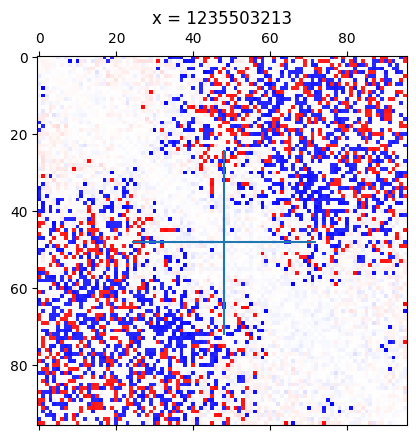

In [73]:
matrix = c.matrix(balance=False).fetch(c.chromnames[5])
matrix_clean = c_clean.matrix(balance=False).fetch(c.chromnames[5])

mat = np.log10(matrix+1e-6) - np.log10(matrix_clean+1e-6)
mat = 2.*(mat - np.min(mat))/np.ptp(mat)-1

fig = plt.figure()
ax = fig.add_subplot(111)
im = ax.matshow(mat[167692801//resolution-48:167692801//resolution+48, 167692801//resolution-48:167692801//resolution+48], cmap='bwr')
ax.hlines(y=48, xmin=24, xmax=72)
ax.vlines(x=48, ymin=24, ymax=72)
plt.title('x = 1235503213')
plt.show()
plt.close()

In [66]:
get_chromosome_coords([1235533567,], c.chromsizes, 1)

[(5, 167723155)]

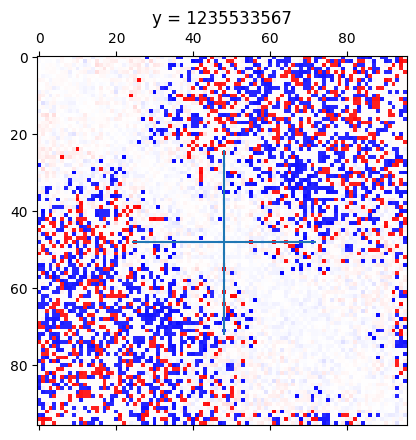

In [74]:
matrix = c.matrix(balance=False).fetch(c.chromnames[5])
matrix_clean = c_clean.matrix(balance=False).fetch(c.chromnames[5])

mat = np.log10(matrix+1e-6) - np.log10(matrix_clean+1e-6)
mat = 2.*(mat - np.min(mat))/np.ptp(mat)-1

fig = plt.figure()
ax = fig.add_subplot(111)
im = ax.matshow(mat[167723155//resolution-48:167723155//resolution+48, 167723155//resolution-48:167723155//resolution+48], cmap='bwr')
ax.hlines(y=48, xmin=24, xmax=72)
ax.vlines(x=48, ymin=24, ymax=72)
plt.title('y = 1235533567')
plt.show()
plt.close()

In [68]:
get_chromosome_coords([2919645549,], c.chromsizes, 1)

[(22, 19089643)]

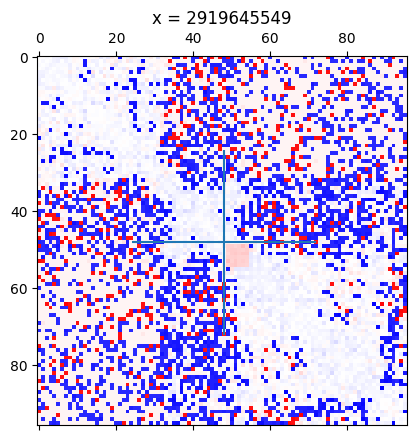

In [75]:
matrix = c.matrix(balance=False).fetch(c.chromnames[22])
matrix_clean = c_clean.matrix(balance=False).fetch(c.chromnames[22])

mat = np.log10(matrix+1e-6) - np.log10(matrix_clean+1e-6)
mat = 2.*(mat - np.min(mat))/np.ptp(mat)-1

fig = plt.figure()
ax = fig.add_subplot(111)
im = ax.matshow(mat[19089643//resolution-48:19089643//resolution+48, 19089643//resolution-48:19089643//resolution+48], cmap='bwr')
ax.hlines(y=48, xmin=24, xmax=72)
ax.vlines(x=48, ymin=24, ymax=72)
plt.title('x = 2919645549')
plt.show()
plt.close()

# How far undetected BPs are?

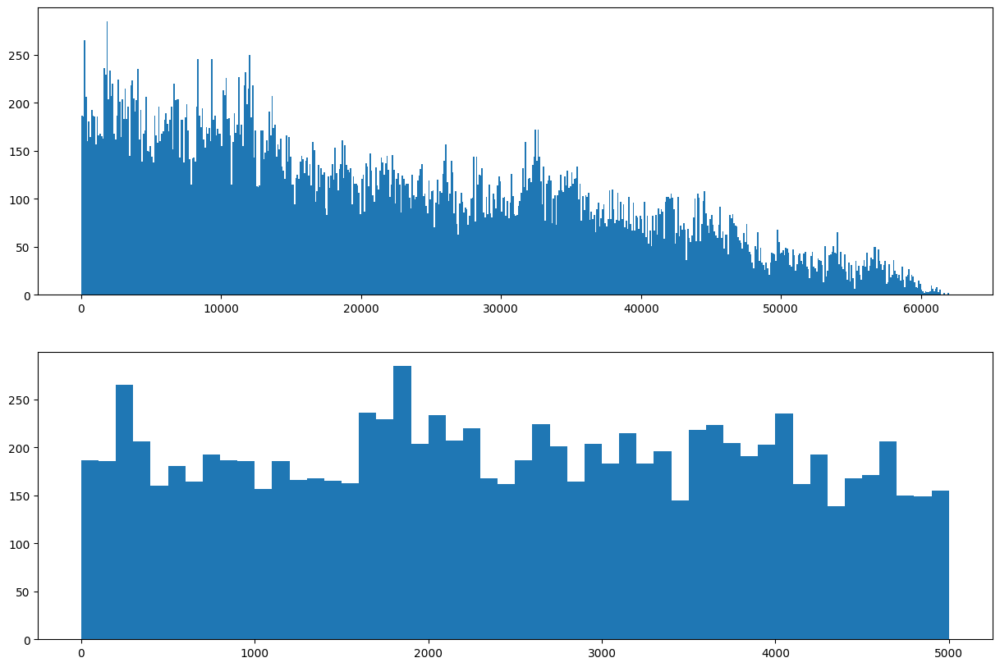

In [ ]:
results = pd.read_csv(f"{local_path}data/apes/real_tests/step_1_50kb.csv")
result_res=50000
image_size = 48
bps = sorted(list(results.bp_1))
segments = []
segment_start = bps[0]
segment_end = bps[0]
for bp in bps:
    if bp-segment_end > image_size:
        segments.append((segment_start, segment_end))
        segment_start = bp
    segment_end = bp

segments_len = [s[1]-s[0] for s in segments]

step = 1
gor['wgc_x'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefStart'], row['achr'], 1), axis=1)
gor['wgc_y'] = gor.apply(lambda row: get_genome_coords_single(row['T2T Chm13\n RefEnd'], row['achr'], 1), axis=1)
answers_bp_x = sorted(list(gor.wgc_x))
answers_bp_y = sorted(list(gor.wgc_y))
answers_bp_x_hited_1 = np.zeros(len(answers_bp_x))
answers_bp_y_hited_1 = np.zeros(len(answers_bp_y))
mis_lengths = []

hited_segements_1 = np.zeros(len(segments))
for i, segment in enumerate(segments):
    for i_x, bp_x in enumerate(answers_bp_x):
        if (segment[0]-24-step)<= bp_x//result_res <= (segment[1]+24+step):
            hited_segements_1[i] = 1
            answers_bp_x_hited_1[i_x] += 1
    for i_y, bp_y in enumerate(answers_bp_y):
        if (segment[0]-24-step)<= bp_y//result_res <= (segment[1]+24+step):
            hited_segements_1[i] = 1
            answers_bp_y_hited_1[i_y] += 1



fig, axs = plt.subplots(2, 1, figsize=(15, 10))
custom_bins = [0, 1, 10 , 20, 100, 200, 300, 500, 600, 700, 800, 900 ,1000, 10000, 20000, 30000, 40000, 50000, 60000]
binwidth=100
axs[0].hist(mis_lengths, bins=range(0, max(mis_lengths) + binwidth, binwidth))

axs[1].hist([l for l in mis_lengths if l < 5000], bins=range(0, 5100, binwidth))
plt.show()